In [24]:
import pandas as pd
df = pd.read_csv("sensor_tt_spin.csv")

In [25]:
import os
os.listdir()

['Done',
 'gesture.ipynb',
 'GRPC 10 Clients.txt',
 'GRPC 2 Clients.txt',
 'GRPC 5 clients.txt',
 'GRPC 50 Clients.txt',
 'HTTP 5 Clients.txt',
 'HTTP 50 clients.txt',
 'HTTP client 2.txt',
 'HTTP client.txt',
 'labeled_imu_segments.pkl',
 'MQTT 2 Clients.txt',
 'MQTT 5 clients.txt',
 'MQTT 50 clients.txt',
 'MQTT Client 10.txt',
 'New folder',
 'sensor_data_current.csv',
 'sensor_ht_spin.csv',
 'sensor_tester.csv',
 'sensor_tt_spin.csv']

In [26]:
len(df)

878

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import os
import pickle # To save the processed data easily

In [2]:
# --- Functions ---

def load_data(filepath):
    """Loads the IMU data from the CSV file."""
    if not os.path.exists(filepath):
        raise FileNotFoundError(f"Error: File not found at {filepath}")
    try:
        df = pd.read_csv(filepath)
        # Ensure timestamp is numeric if it's not already
        df['timestamp'] = pd.to_numeric(df['timestamp'], errors='coerce')
        df = df.dropna(subset=['timestamp']) # Remove rows where timestamp couldn't be parsed
        df = df.sort_values('timestamp').reset_index(drop=True) # Ensure data is time-ordered
        print(f"Loaded data with {len(df)} samples.")
        return df
    except Exception as e:
        print(f"Error loading data: {e}")
        return None

def calculate_sampling_rate(df):
    """Calculates the approximate sampling rate in Hz."""
    if len(df) < 2:
        return None # Not enough data to calculate rate
    # Calculate time differences in seconds (timestamps are in ms)
    time_diffs = df['timestamp'].diff() / 1000.0
    avg_period = time_diffs.median() # Use median to be robust to outliers
    if avg_period is None or avg_period <= 0:
         print("Warning: Could not determine a valid sampling period. Using mean.")
         avg_period = time_diffs.mean()
         if avg_period is None or avg_period <= 0:
             print("Error: Still could not determine sampling period. Aborting.")
             return None

    sampling_rate = 1.0 / avg_period
    print(f"Approximate sampling period: {avg_period:.4f} s")
    print(f"Approximate sampling rate: {sampling_rate:.2f} Hz")
    return sampling_rate

def plot_full_data(df):
    """Plots the entire dataset."""
    if df is None or df.empty:
        print("No data to plot.")
        return

    time_seconds = df['timestamp'] / 1000.0 # Convert ms to seconds for plotting

    features = {
        'Accelerometer (m/s^2)': ['ax', 'ay', 'az'],
        'Gyroscope (rad/s)': ['gx', 'gy', 'gz'],
        'Magnetometer (uTesla)': ['mx', 'my', 'mz']
    }

    fig, axes = plt.subplots(len(features), 1, figsize=(12, 10), sharex=True)
    fig.suptitle('Full IMU Sensor Data vs Time', fontsize=16)

    for i, (title, cols) in enumerate(features.items()):
        ax = axes[i]
        for col in cols:
            if col in df.columns:
                ax.plot(time_seconds, df[col], label=col)
        ax.set_ylabel(title)
        ax.legend(loc='upper right')
        ax.grid(True)

    axes[-1].set_xlabel('Time (seconds)')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    print("\nDisplaying plot of the full dataset. Close the plot window to continue...")
    plt.show()


def plot_segment(segment_data, segment_index, start_time_s, end_time_s, sampling_rate):
    """Plots a single data segment."""
    num_samples, num_features = segment_data.shape
    # Create a time axis relative to the start of the segment
    relative_time = np.arange(num_samples) / sampling_rate

    features = {
        'Accelerometer (m/s^2)': [0, 1, 2], # Indices for ax, ay, az
        'Gyroscope (rad/s)': [3, 4, 5],    # Indices for gx, gy, gz
        'Magnetometer (uTesla)': [6, 7, 8] # Indices for mx, my, mz
    }
    feature_labels = ['ax', 'ay', 'az', 'gx', 'gy', 'gz', 'mx', 'my', 'mz']

    fig, axes = plt.subplots(len(features), 1, figsize=(10, 8), sharex=True)
    fig.suptitle(f'Segment {segment_index} (Time: {start_time_s:.2f}s - {end_time_s:.2f}s)', fontsize=14)

    for i, (title, indices) in enumerate(features.items()):
        ax = axes[i]
        for idx in indices:
            ax.plot(relative_time, segment_data[:, idx], label=feature_labels[idx])
        ax.set_ylabel(title)
        ax.legend(loc='upper right')
        ax.grid(True)

    axes[-1].set_xlabel('Time within segment (seconds)')
    plt.tight_layout(rect=[0, 0.03, 1, 0.93]) # Adjust layout
    print(f"\nDisplaying Segment {segment_index}. Close the plot window to enter label.")
    plt.show()


In [3]:
# --- Configuration ---
WINDOW_DURATION_S = 1.5  # Duration of each data window in seconds
SLIDE_DURATION_S = 0.5   # How much the window slides each step in seconds
VALID_LABELS = ['spin', 'jump', 'weave', 'null', 'quit']
OUTPUT_FILE = 'labeled_imu_segments.pkl'

In [63]:
# --- Main Execution ---
if __name__ == "__main__":
    # 1. Load Data
    df = load_data(CSV_FILE)
    if df is None:
        exit()

    # 2. Calculate Sampling Rate
    sampling_rate = calculate_sampling_rate(df)
    if sampling_rate is None:
         print("Could not determine sampling rate. Exiting.")
         exit()

    # Calculate window and slide size in samples
    window_size = math.ceil(WINDOW_DURATION_S * sampling_rate)
    slide_size = math.ceil(SLIDE_DURATION_S * sampling_rate)
    print(f"Window size: {window_size} samples ({WINDOW_DURATION_S}s)")
    print(f"Slide size: {slide_size} samples ({SLIDE_DURATION_S}s)")

    if window_size <= 0 or slide_size <=0:
        print("Error: Window or slide size calculated as zero or negative. Check durations and sampling rate.")
        exit()
    if window_size > len(df):
         print(f"Warning: Window size ({window_size}) is larger than total samples ({len(df)}).")
         # Adjust or exit depending on desired behavior. Let's proceed but it will only generate 0 segments.

    # 3. Plot Full Data
    plot_full_data(df)

    # 4. Windowing and Labeling
    labeled_segments = []
    features_to_keep = ['ax', 'ay', 'az', 'gx', 'gy', 'gz', 'mx', 'my', 'mz']
    segment_index = 0

    print("\n--- Starting Manual Labeling ---")
    print(f"Enter one of the following labels for each segment:")
    print(f"  {', '.join(VALID_LABELS[:-1])}")
    print(f"Enter 'quit' to stop labeling.")

    for i in range(0, len(df) - window_size + 1, slide_size):
        start_index = i
        end_index = i + window_size

        segment_df = df.iloc[start_index:end_index]
        segment_data = segment_df[features_to_keep].values # Extract data as numpy array, no timestamp

        # Get segment time range for plotting title
        start_time_s = df.iloc[start_index]['timestamp'] / 1000.0
        end_time_s = df.iloc[end_index - 1]['timestamp'] / 1000.0 # Use end_index-1 as end_index is exclusive

        # Plot the segment
        plot_segment(segment_data, segment_index, start_time_s, end_time_s, sampling_rate)

        # Get user label
        while True:
            user_label = input(f"Segment {segment_index} | Label ({'/'.join(VALID_LABELS)}): ").lower().strip()
            if user_label in VALID_LABELS:
                break
            else:
                print(f"Invalid label. Please enter one of: {', '.join(VALID_LABELS)}")

        if user_label == 'quit':
            print("Quit command received. Stopping labeling.")
            break

        # Store the data and label
        labeled_segments.append({
            'data': segment_data,
            'label': user_label,
            'start_time_s': start_time_s, # Optional: keep for reference
            'end_time_s': end_time_s    # Optional: keep for reference
        })
        segment_index += 1

    print(f"\n--- Labeling Complete ---")
    print(f"Total segments labeled: {len(labeled_segments)}")

    # 5. Save Labeled Data
    if labeled_segments:
        try:
            with open(OUTPUT_FILE, 'wb') as f:
                pickle.dump(labeled_segments, f)
            print(f"Labeled segments saved to '{OUTPUT_FILE}'")
        except Exception as e:
            print(f"Error saving data: {e}")
    else:
        print("No segments were labeled, nothing to save.")

FileNotFoundError: Error: File not found at sensor_tt_spin.csv

In [13]:
first_data = labeled_segments

In [ ]:
len(labeled_segments)

In [22]:
#CSV_FILE = 'sensor_t7.csv'
CSV_FILE = 'New folder\sensor_t7_5.csv'
OUTPUT_FILE = 'labeled_imu_segments.pkl'

Loaded data with 878 samples.
Approximate sampling period: 0.0340 s
Approximate sampling rate: 29.41 Hz
Window size: 45 samples (1.5s)
Slide size: 15 samples (0.5s)

Displaying plot of the full dataset. Close the plot window to continue...


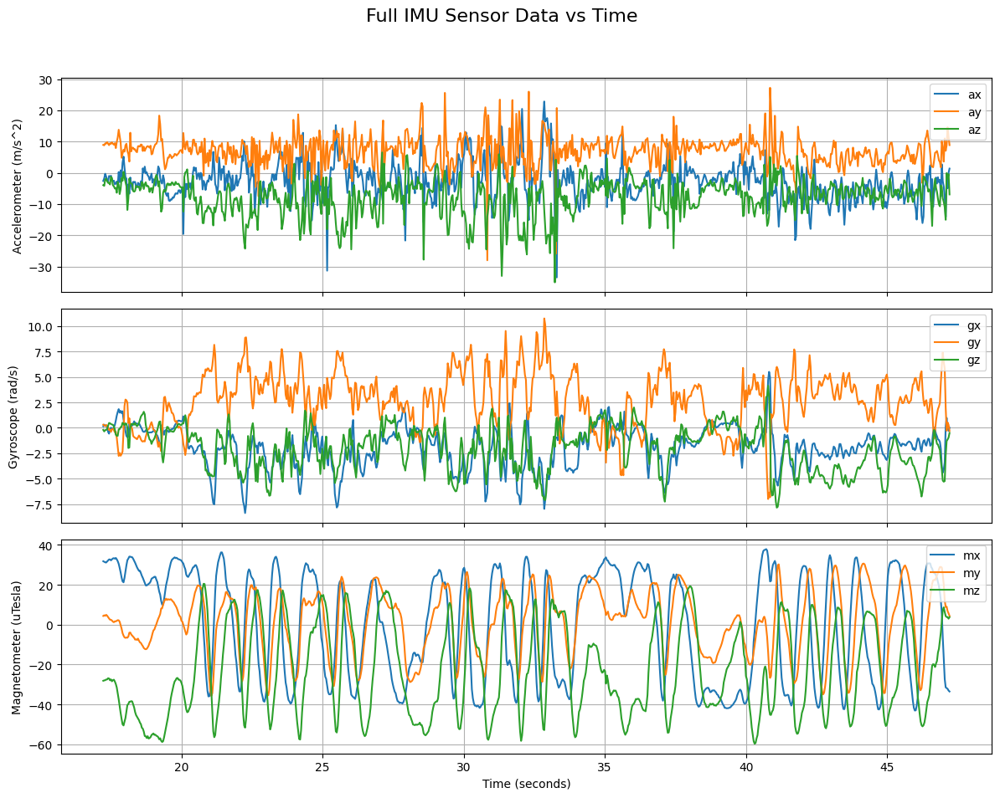


--- Starting Manual Labeling ---
Enter one of the following labels for each segment:
  spin, jump, weave, null
Enter 'quit' to stop labeling.

Displaying Segment 0. Close the plot window to enter label.


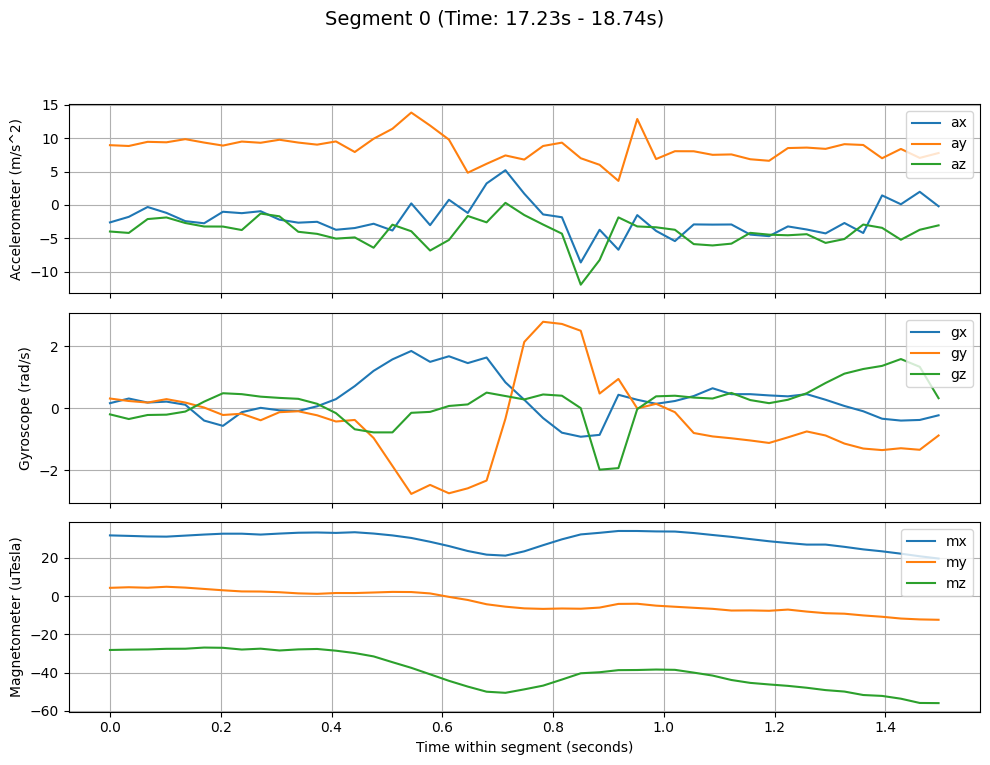


Displaying Segment 1. Close the plot window to enter label.


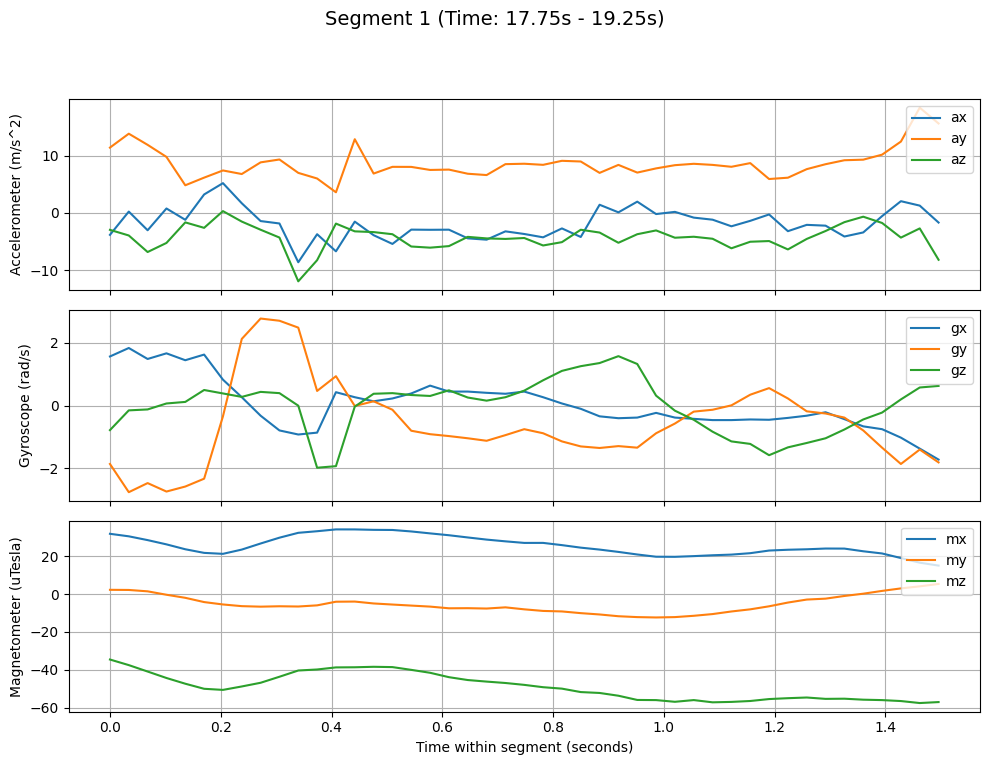


Displaying Segment 2. Close the plot window to enter label.


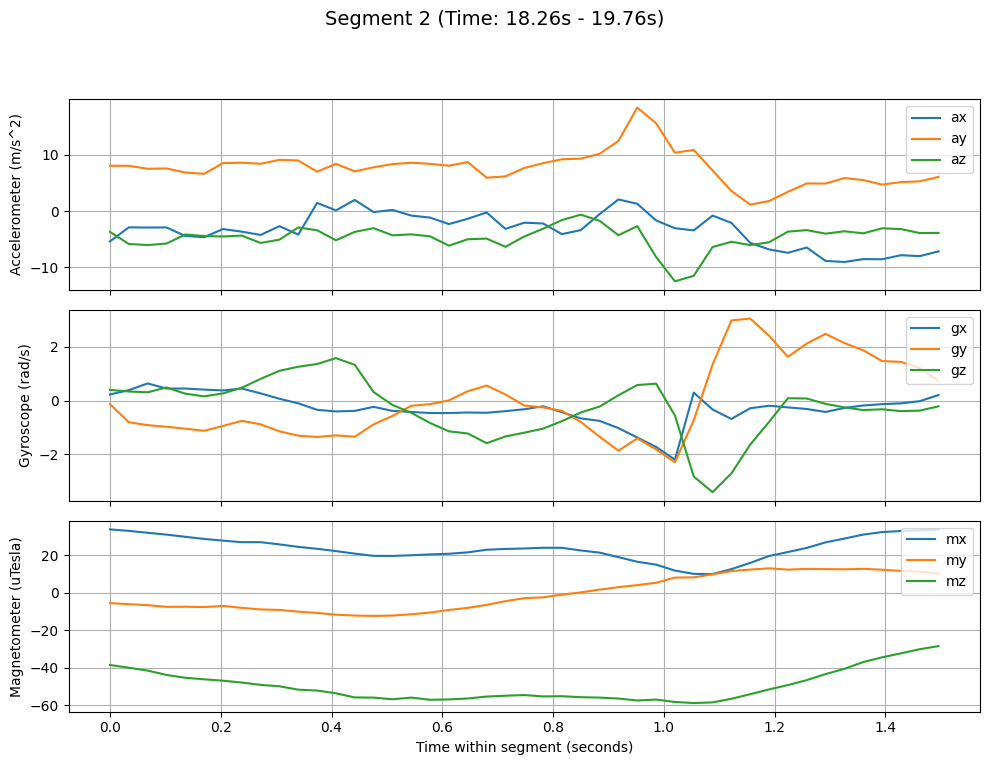


Displaying Segment 3. Close the plot window to enter label.


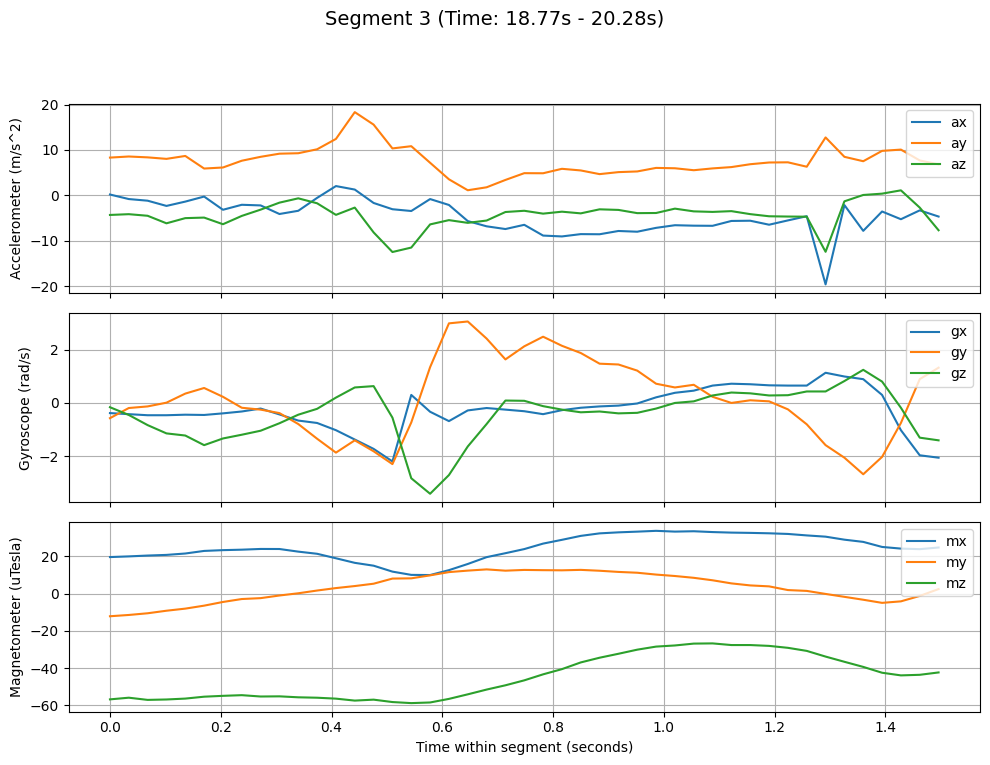


Displaying Segment 4. Close the plot window to enter label.


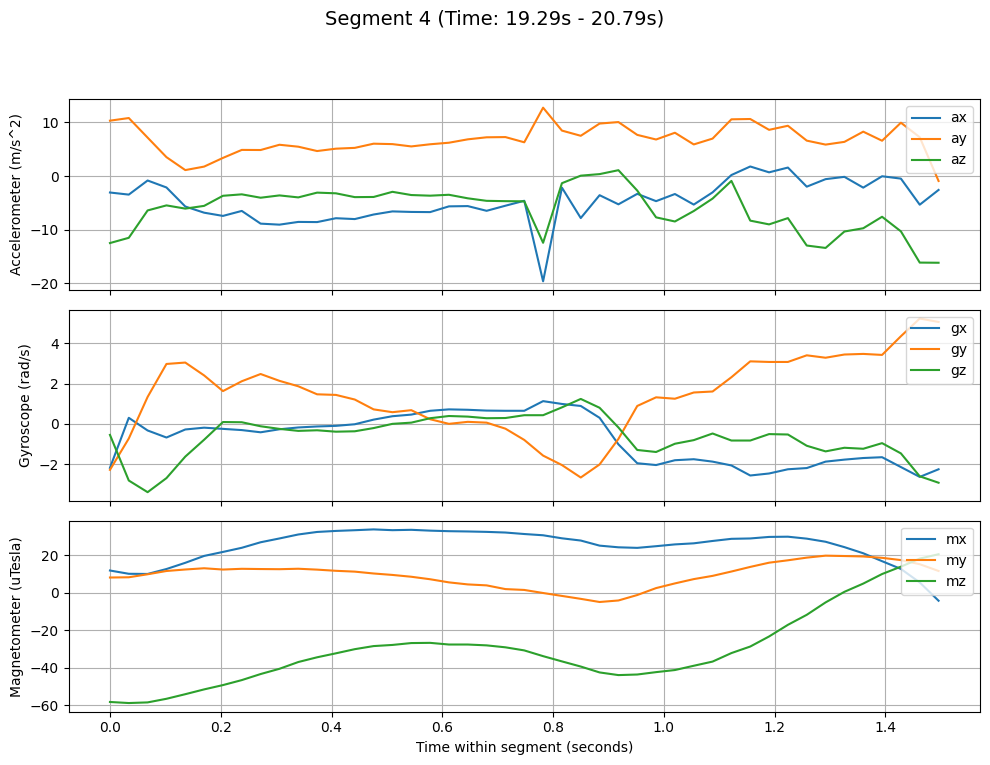


Displaying Segment 5. Close the plot window to enter label.


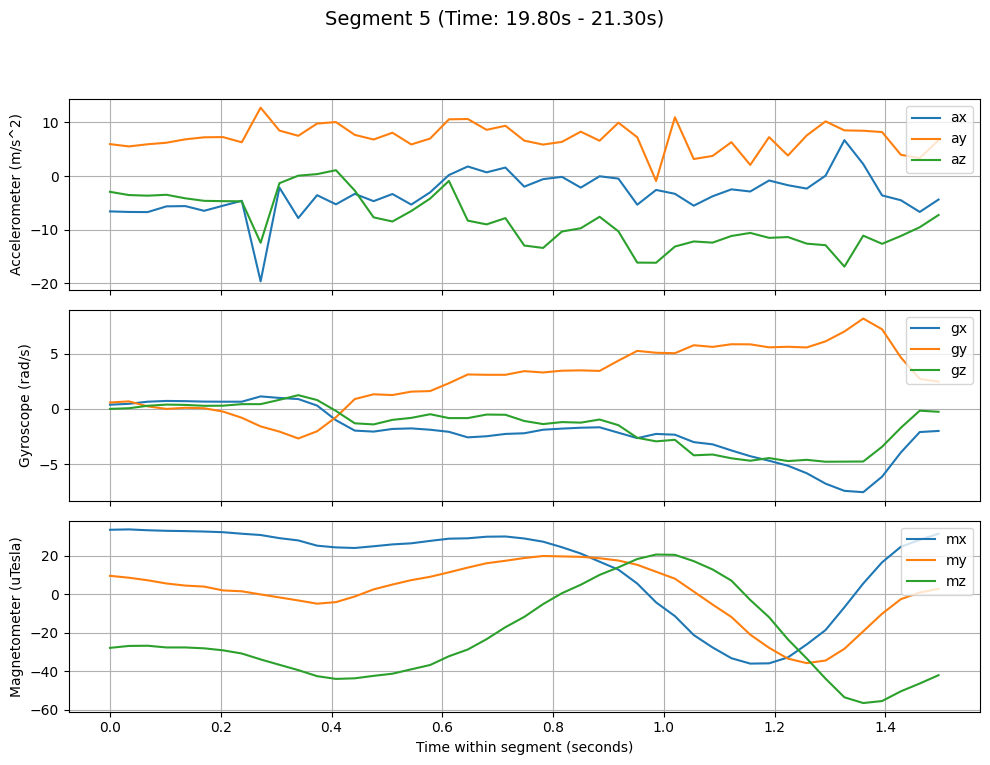


Displaying Segment 6. Close the plot window to enter label.


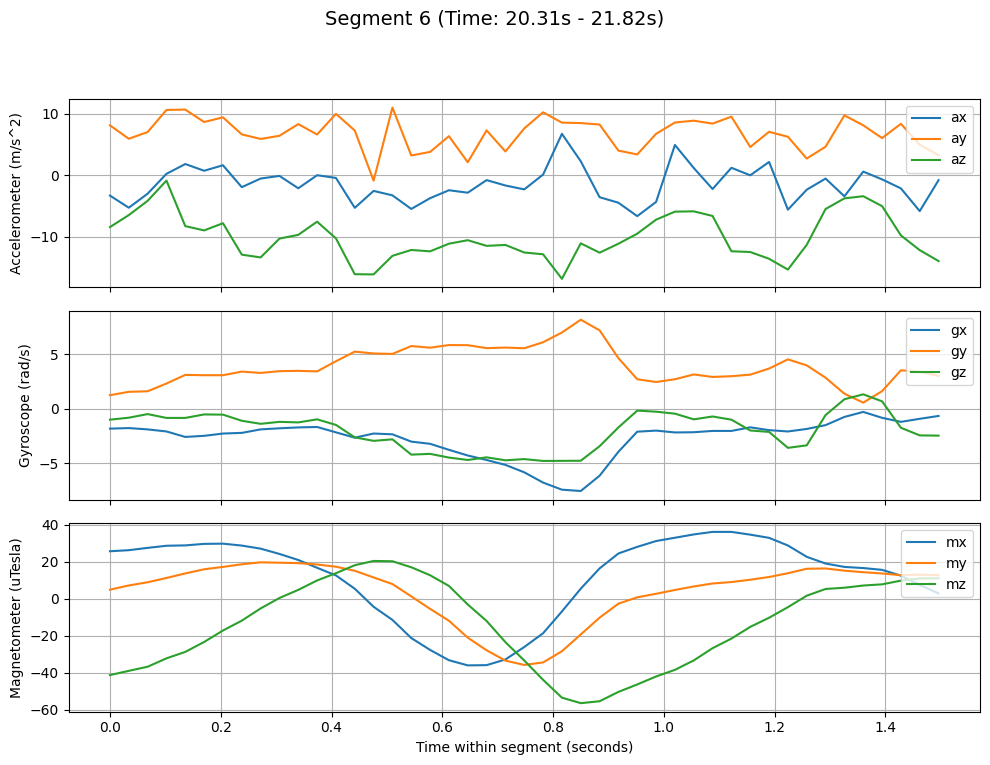


Displaying Segment 7. Close the plot window to enter label.


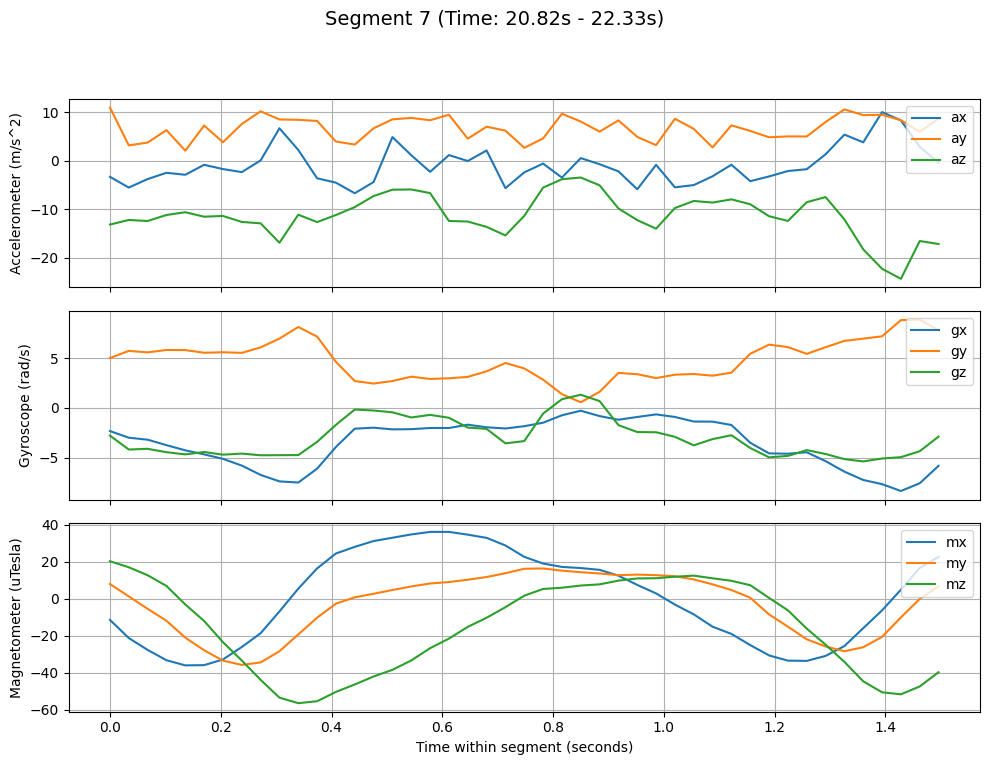


Displaying Segment 8. Close the plot window to enter label.


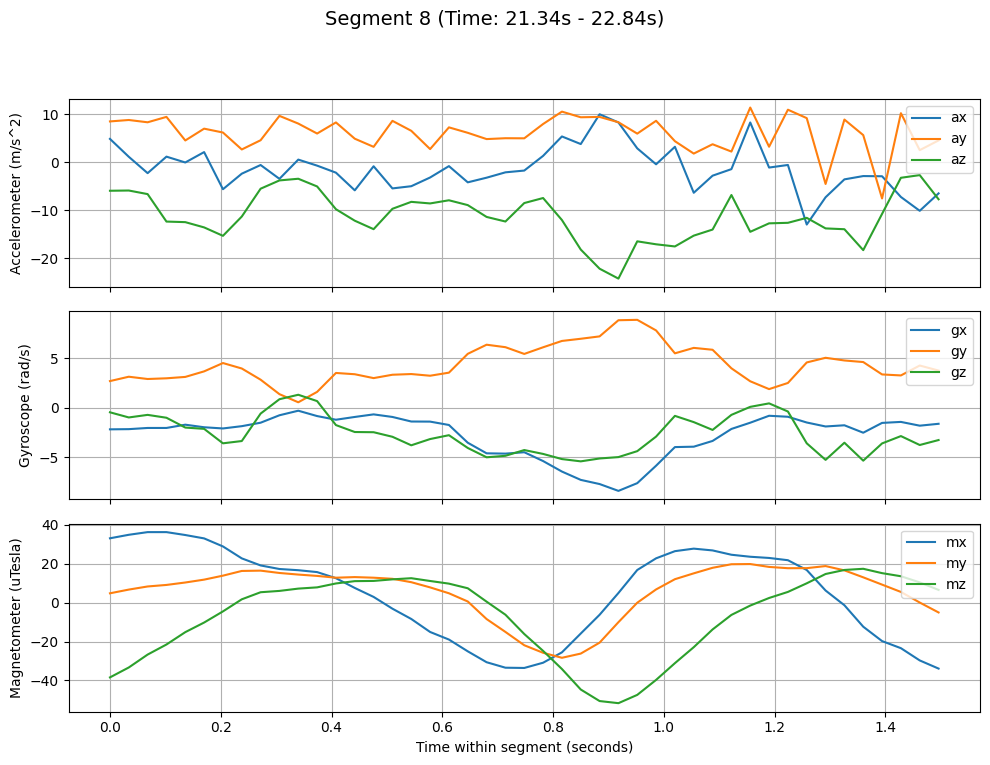


Displaying Segment 9. Close the plot window to enter label.


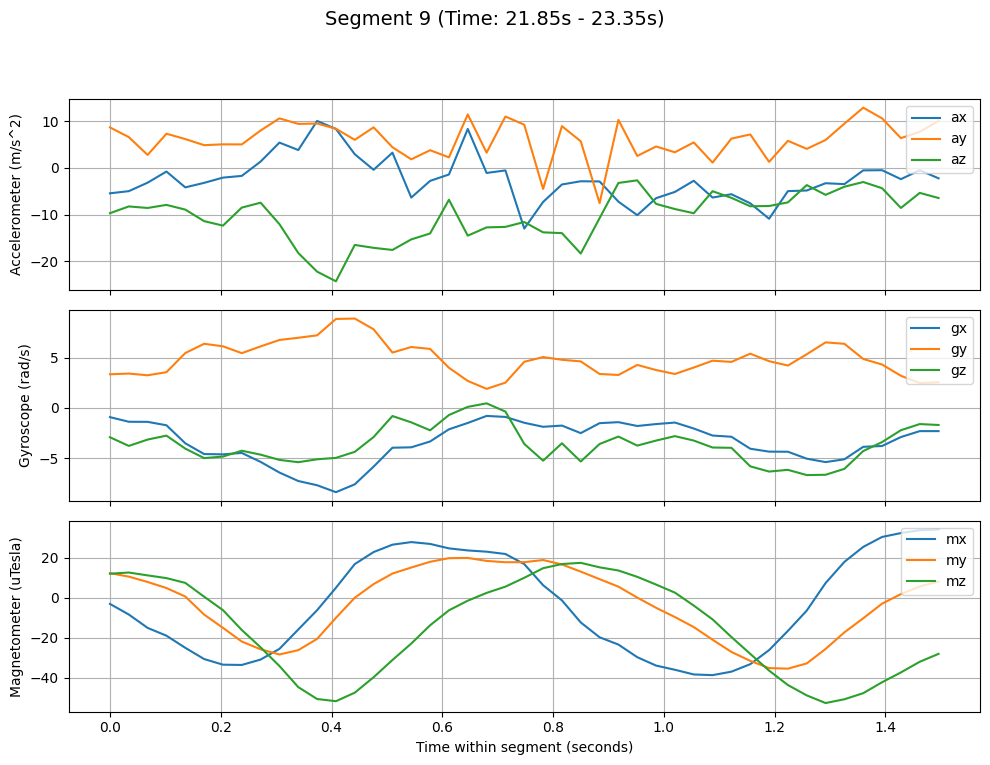


Displaying Segment 10. Close the plot window to enter label.


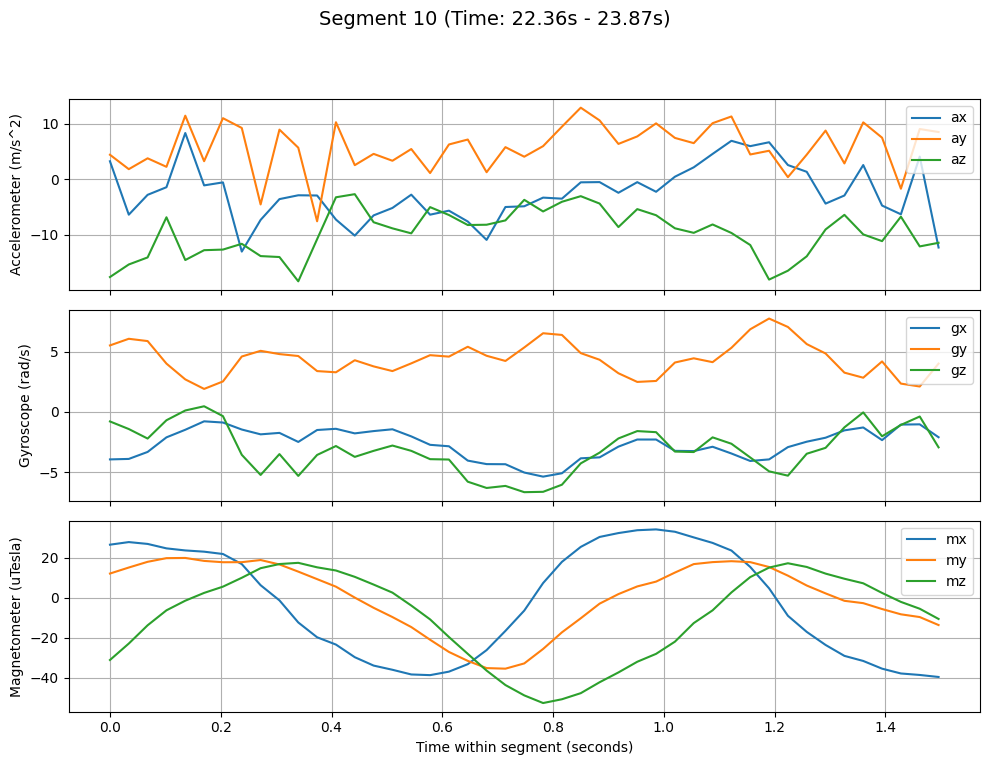


Displaying Segment 11. Close the plot window to enter label.


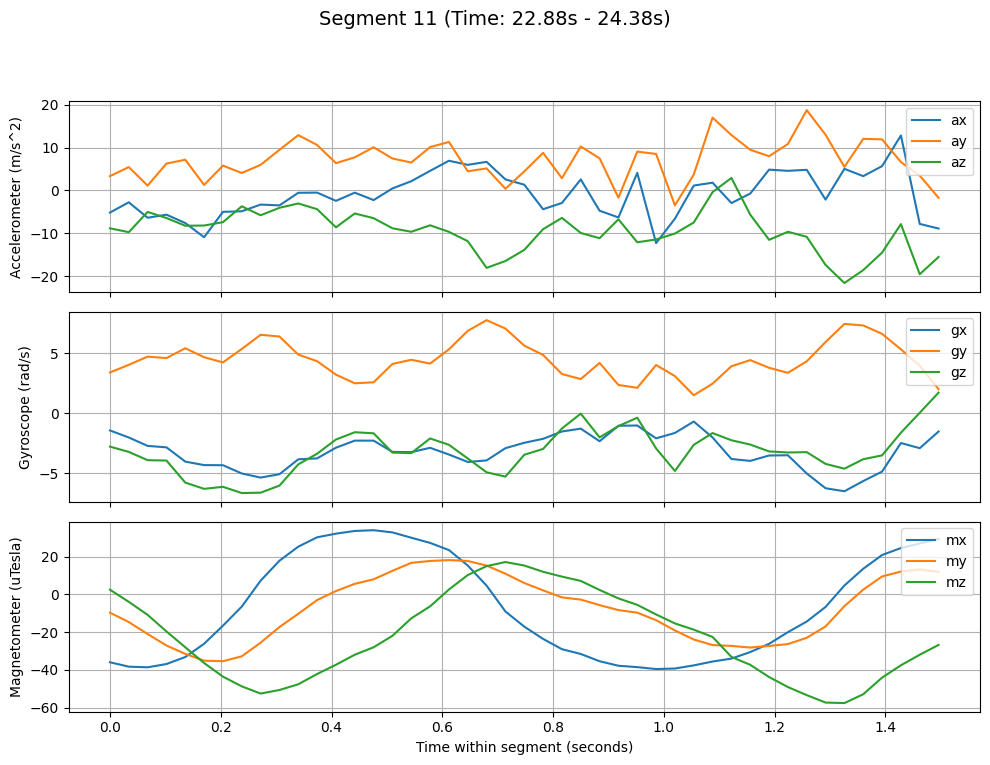


Displaying Segment 12. Close the plot window to enter label.


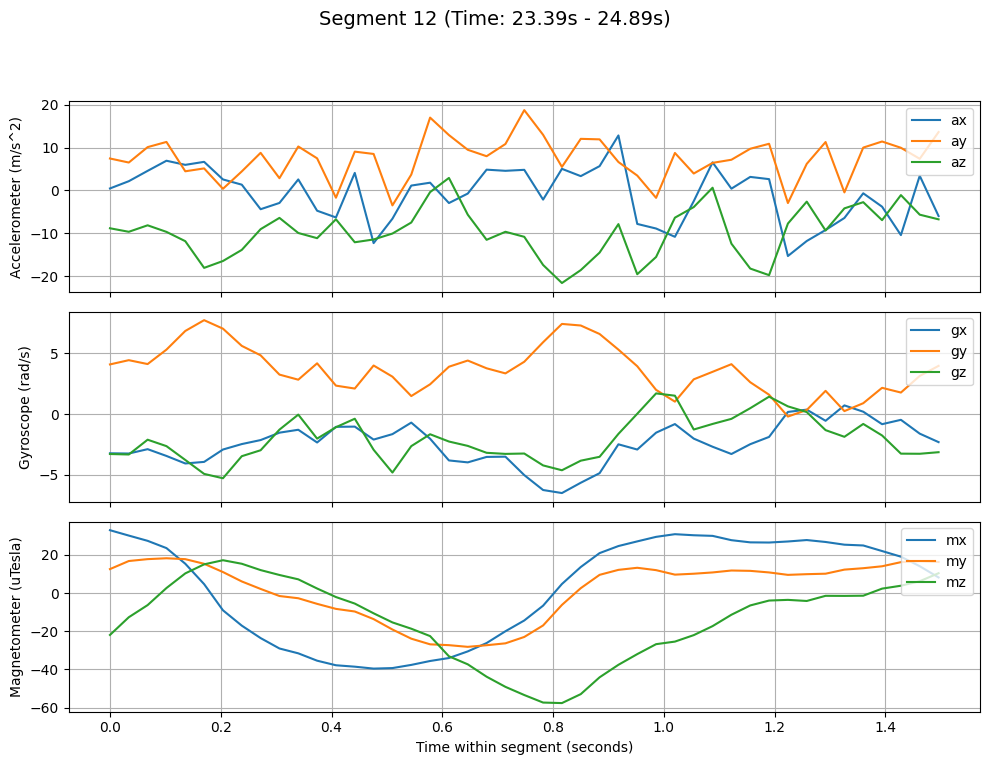


Displaying Segment 13. Close the plot window to enter label.


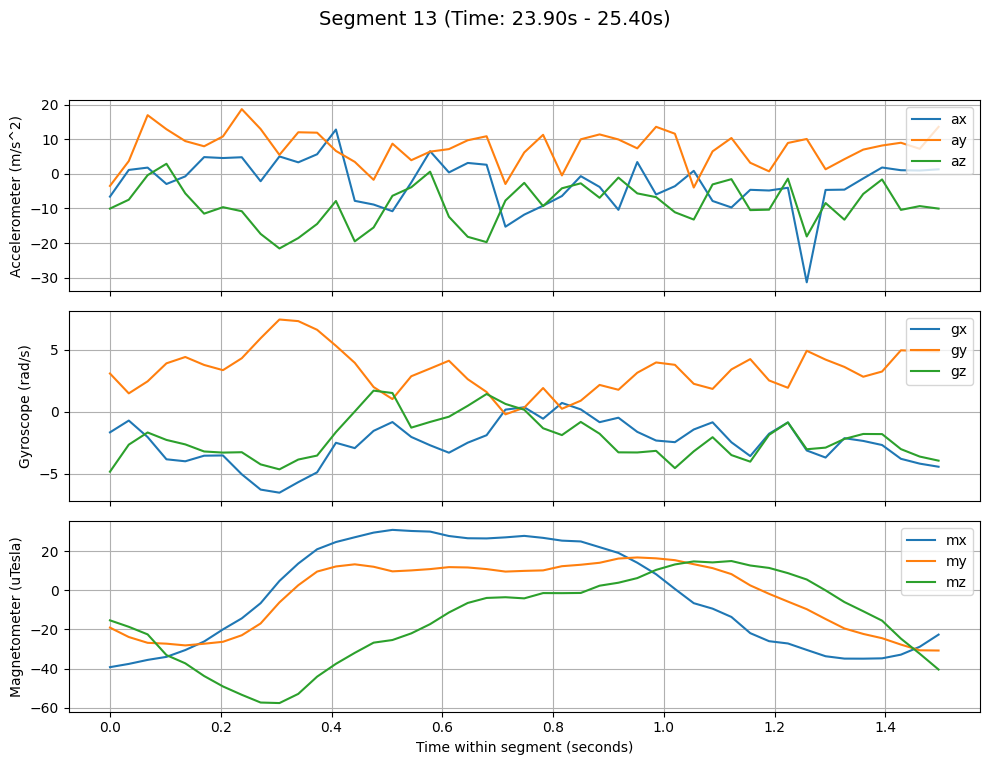


Displaying Segment 14. Close the plot window to enter label.


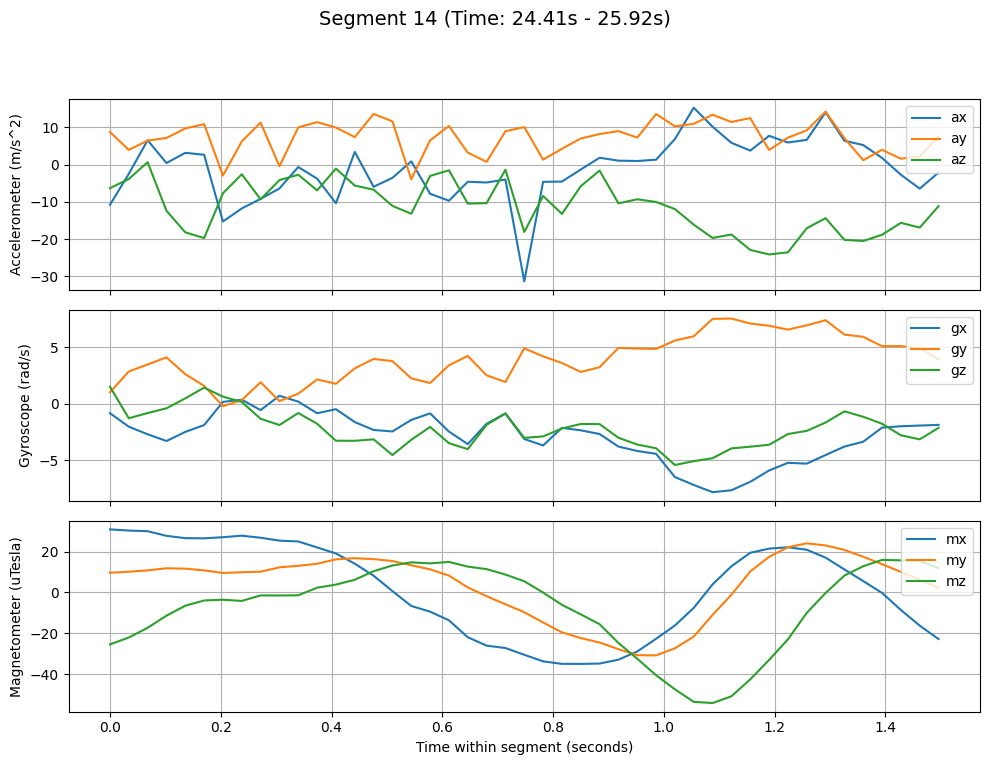


Displaying Segment 15. Close the plot window to enter label.


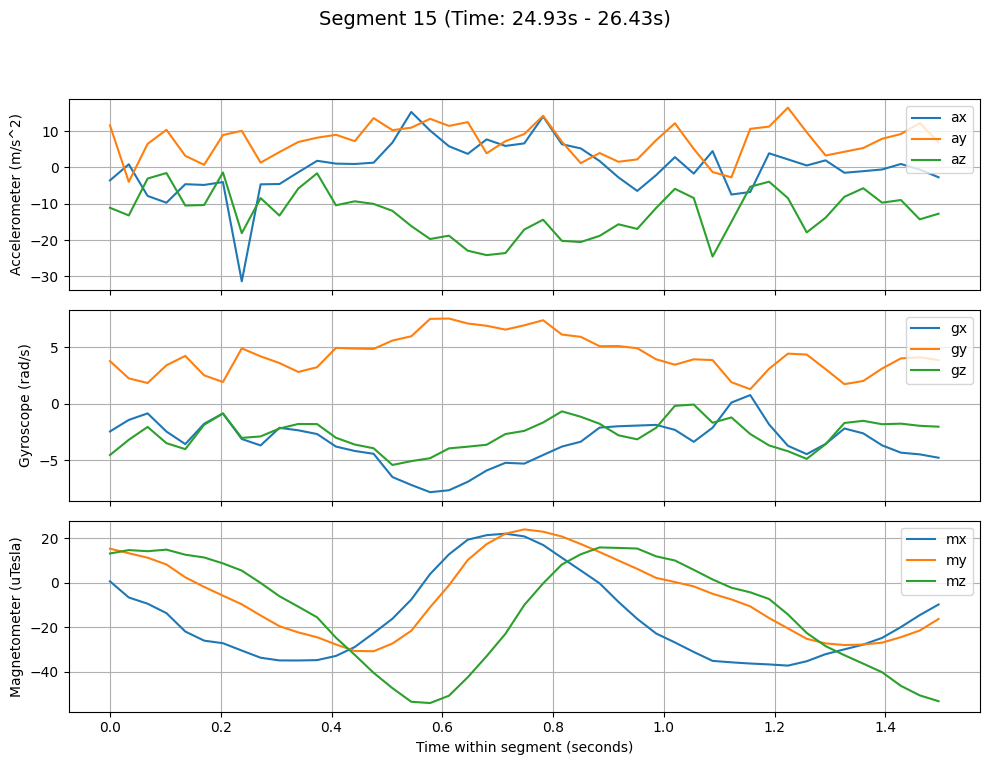


Displaying Segment 16. Close the plot window to enter label.


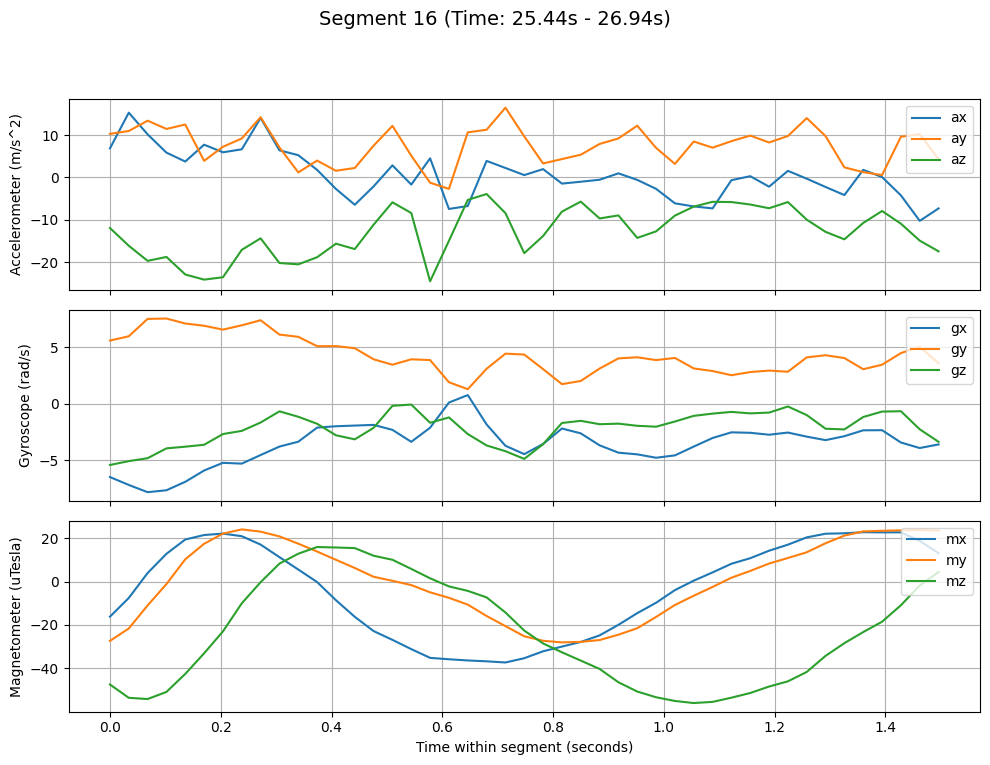


Displaying Segment 17. Close the plot window to enter label.


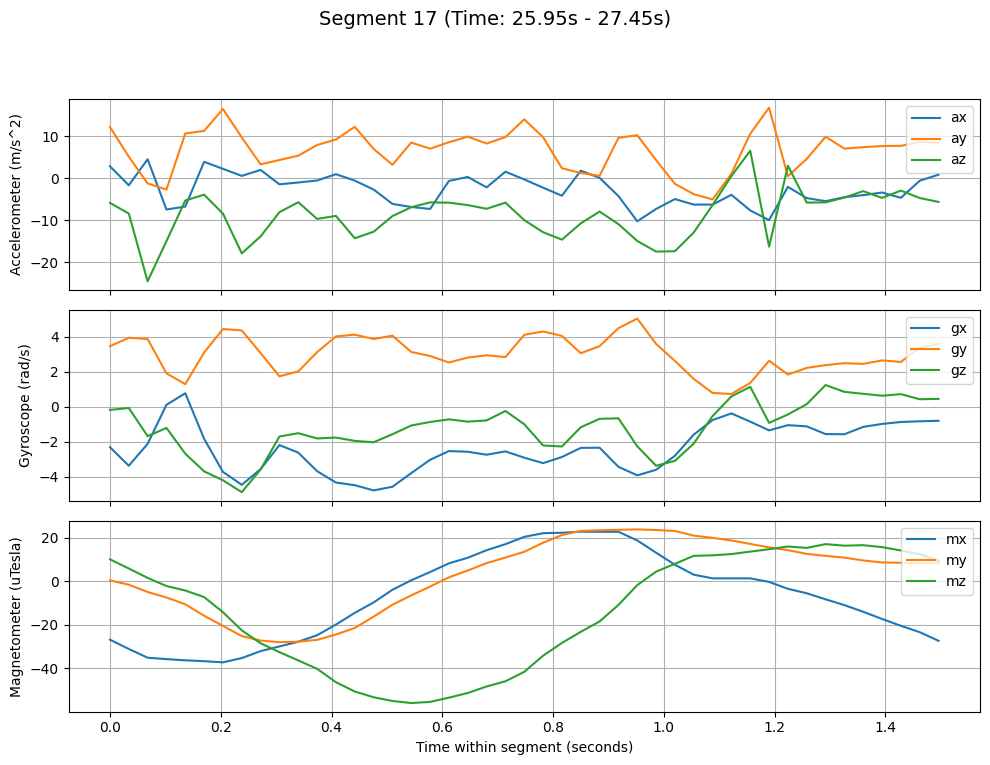


Displaying Segment 18. Close the plot window to enter label.


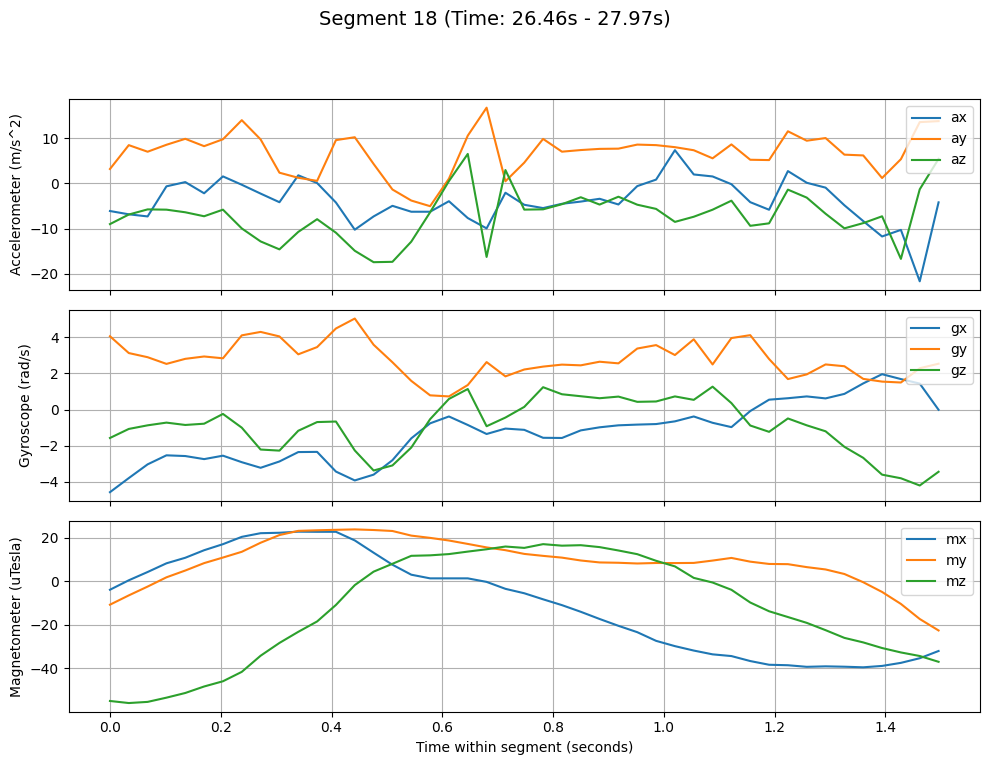


Displaying Segment 19. Close the plot window to enter label.


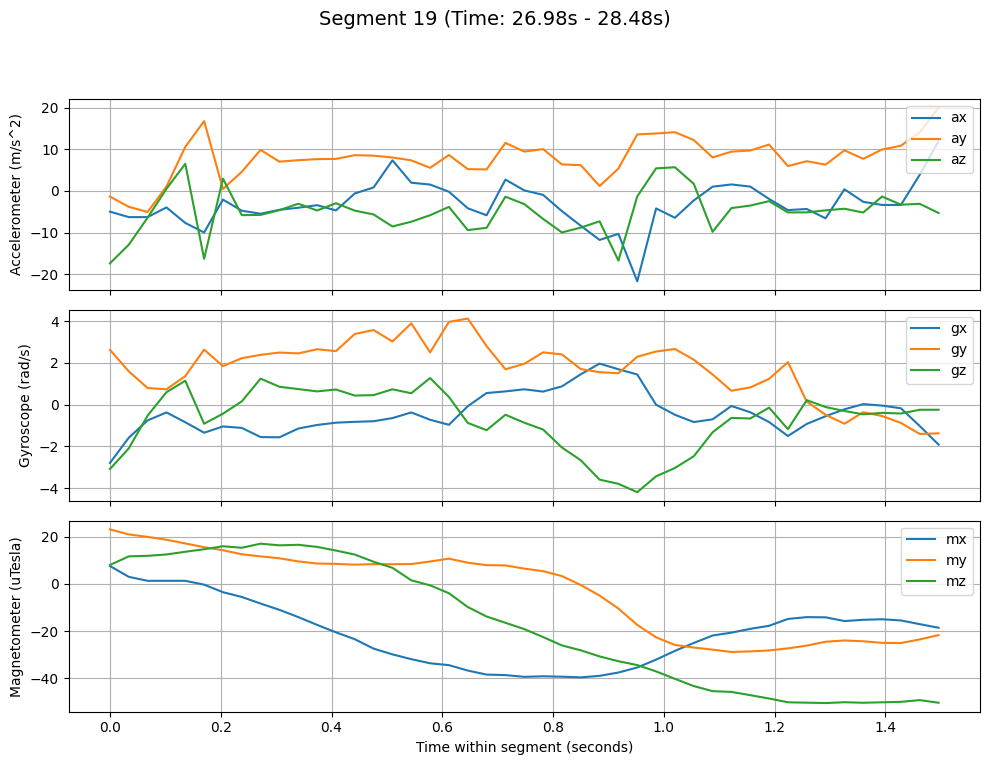


Displaying Segment 20. Close the plot window to enter label.


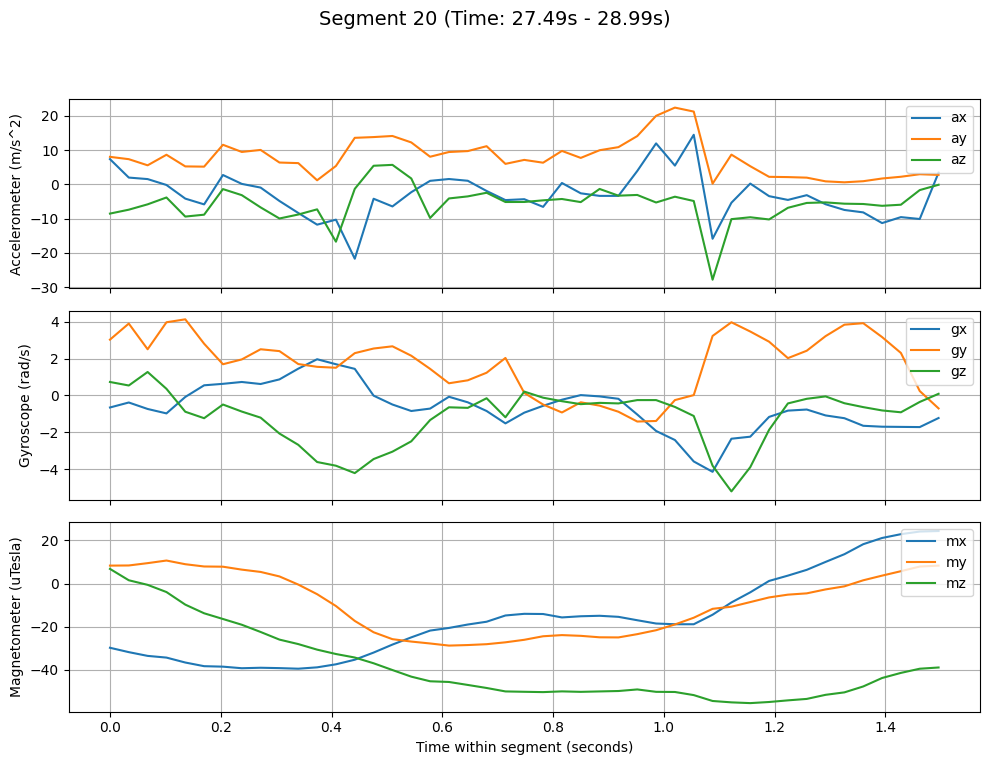


Displaying Segment 21. Close the plot window to enter label.


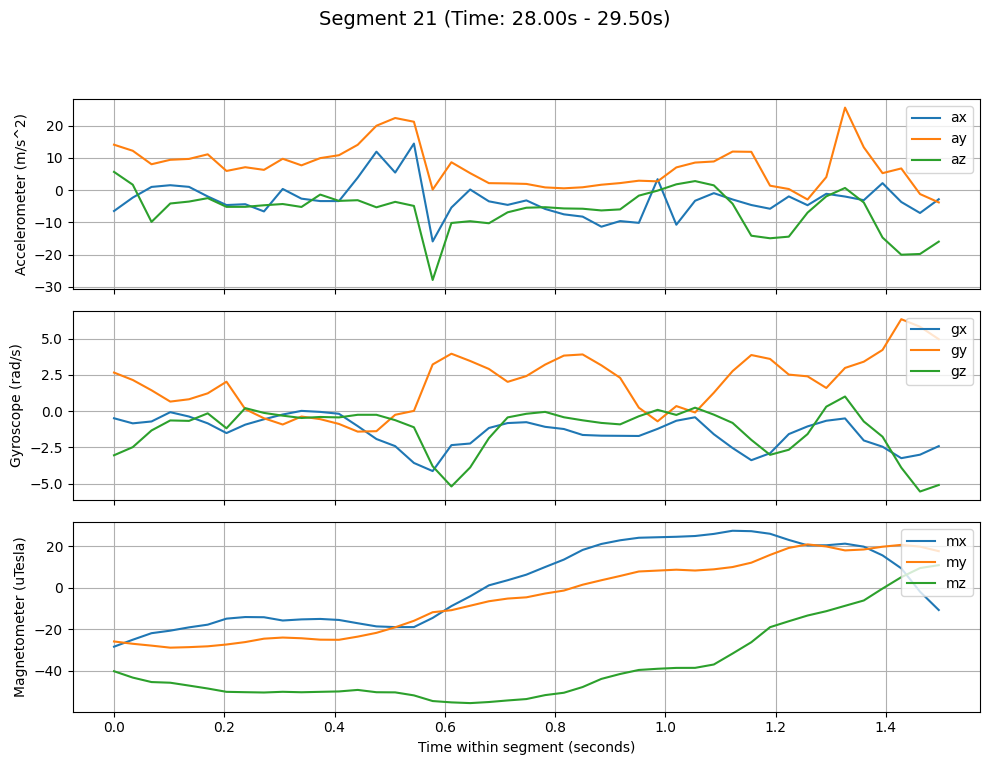


Displaying Segment 22. Close the plot window to enter label.


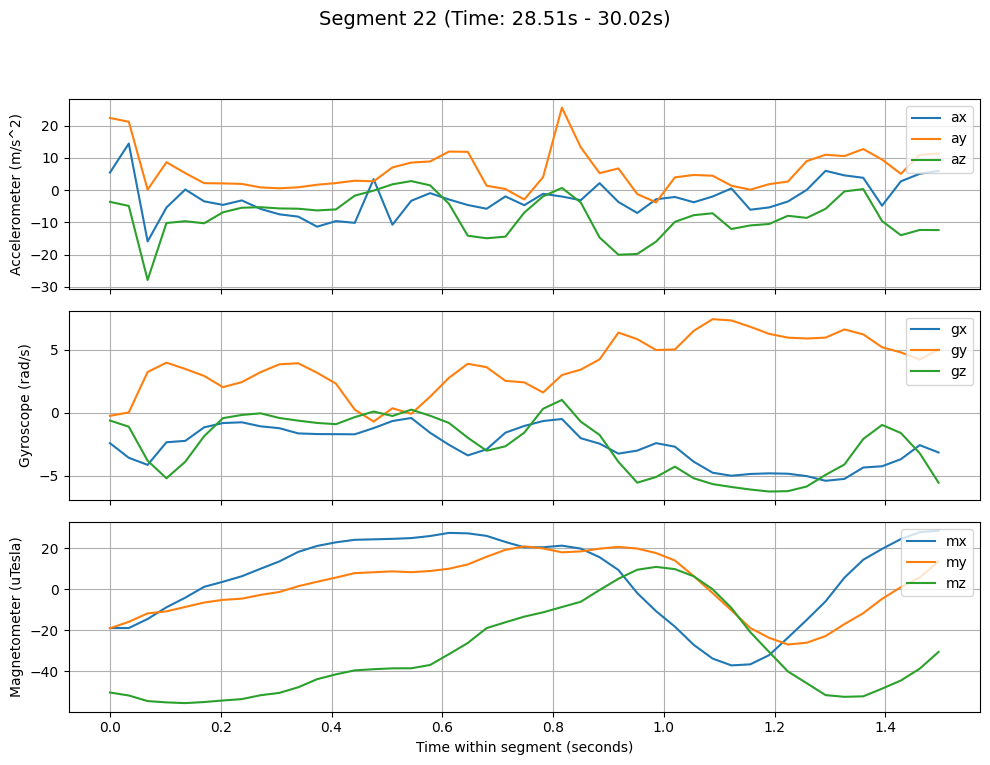


Displaying Segment 23. Close the plot window to enter label.


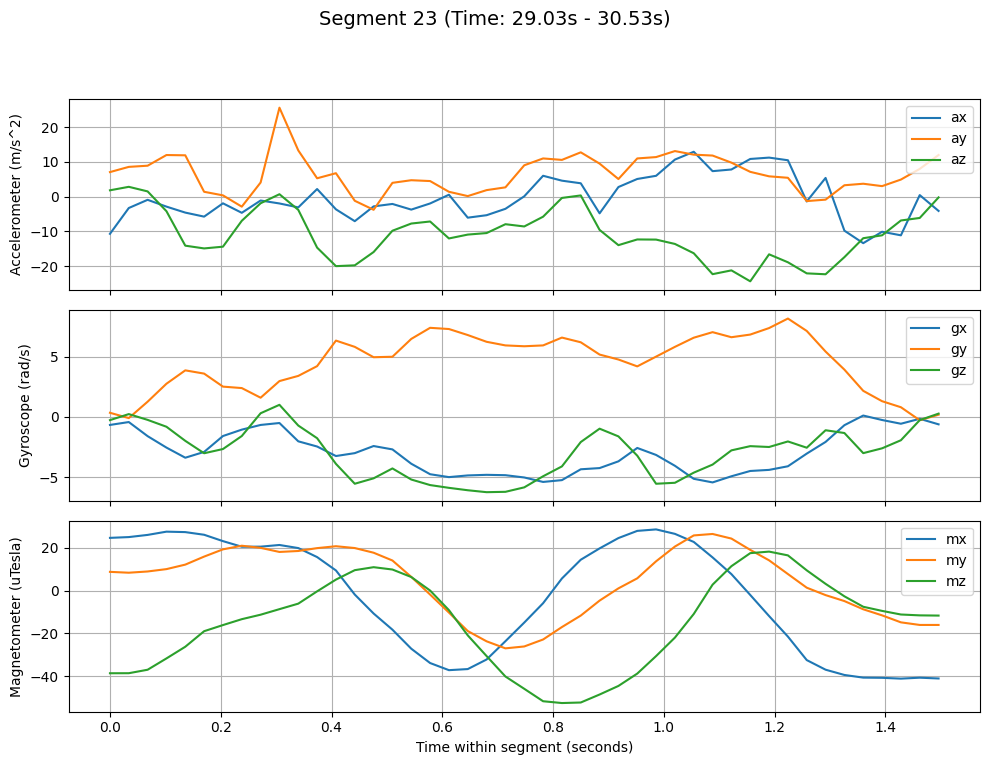


Displaying Segment 24. Close the plot window to enter label.


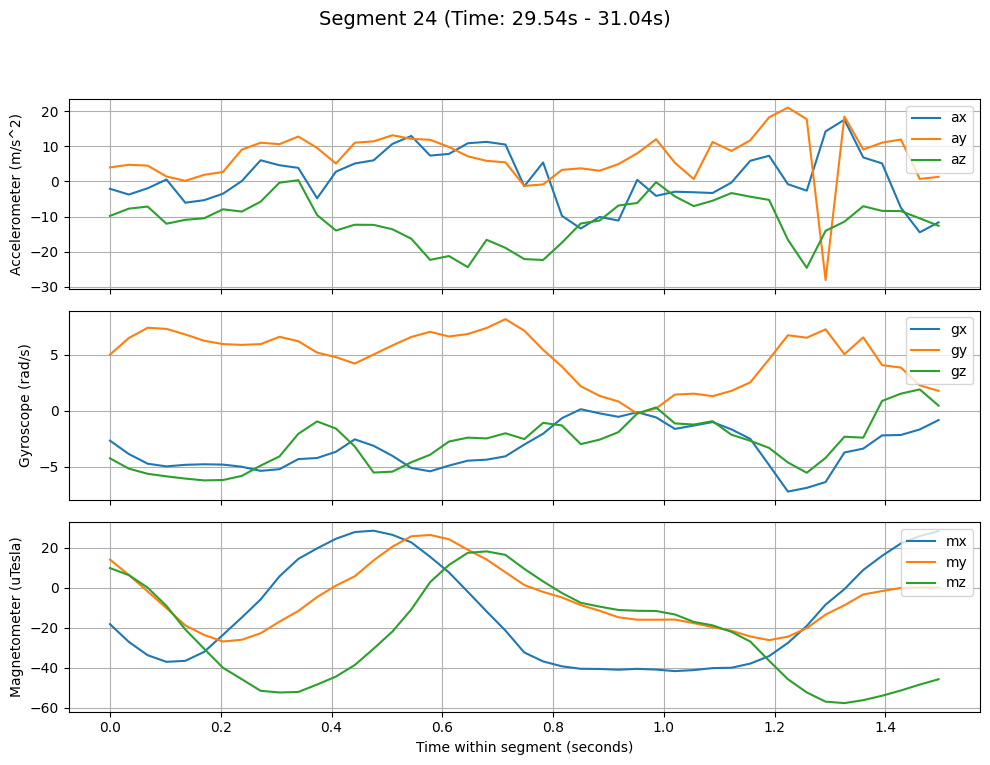


Displaying Segment 25. Close the plot window to enter label.


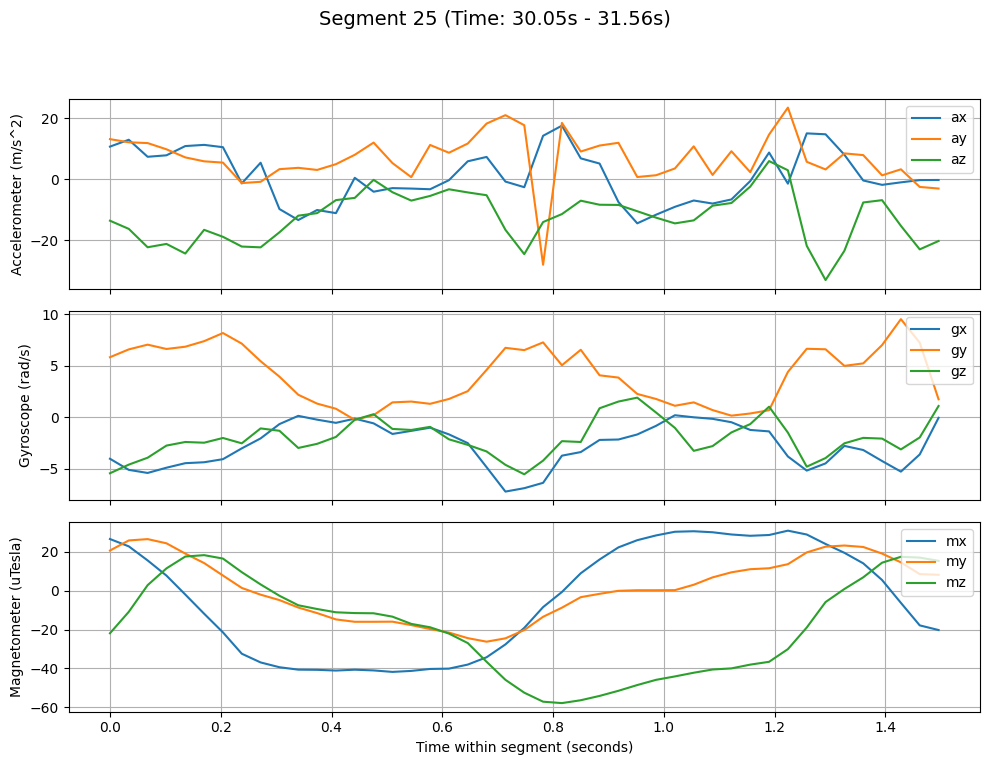


Displaying Segment 26. Close the plot window to enter label.


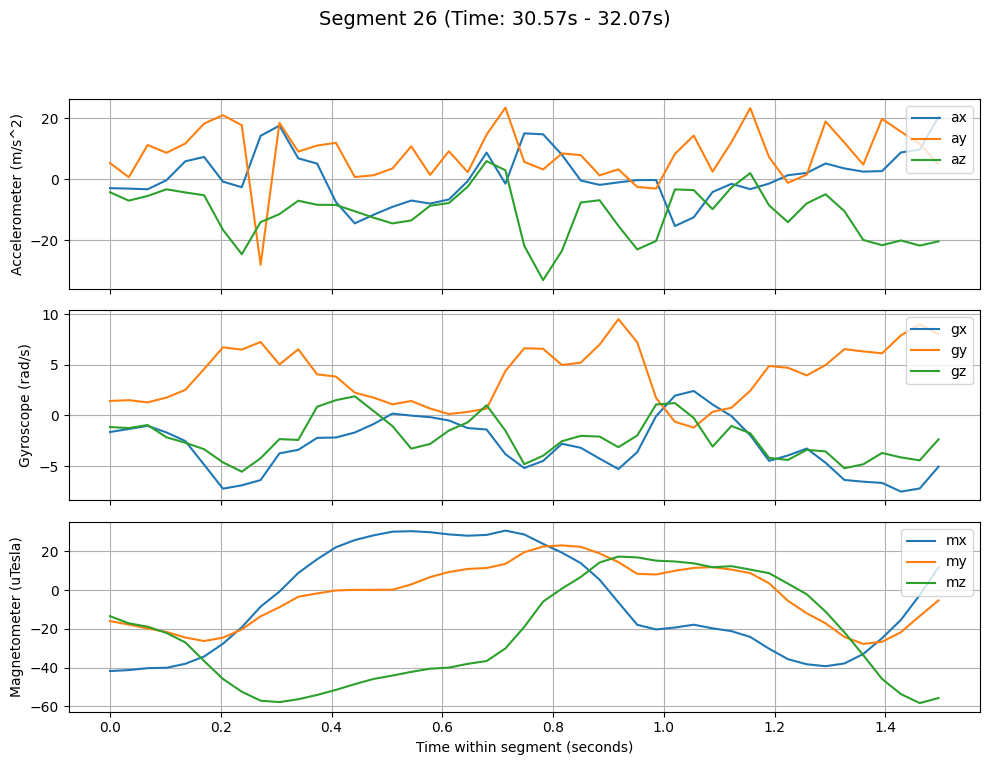


Displaying Segment 27. Close the plot window to enter label.


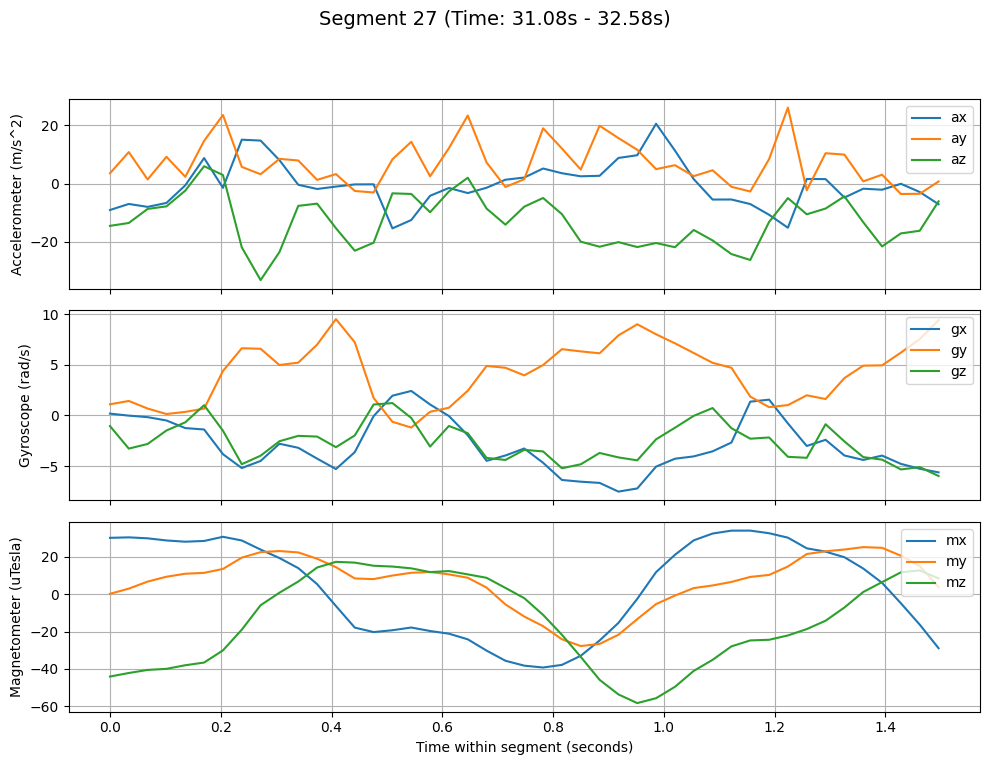


Displaying Segment 28. Close the plot window to enter label.


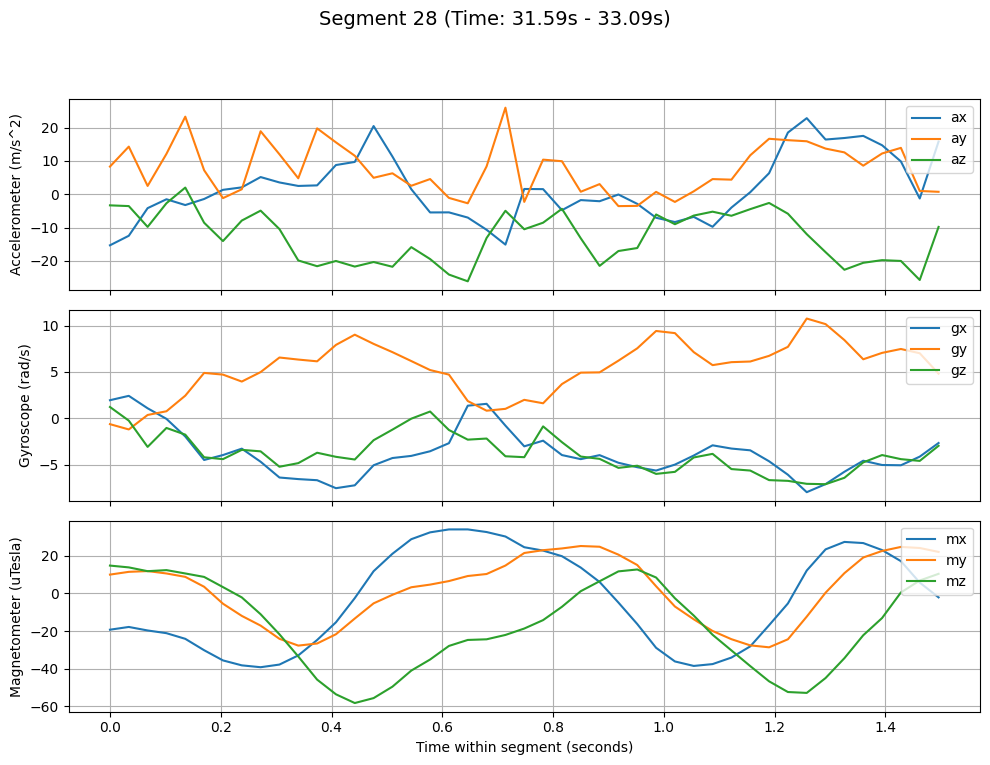


Displaying Segment 29. Close the plot window to enter label.


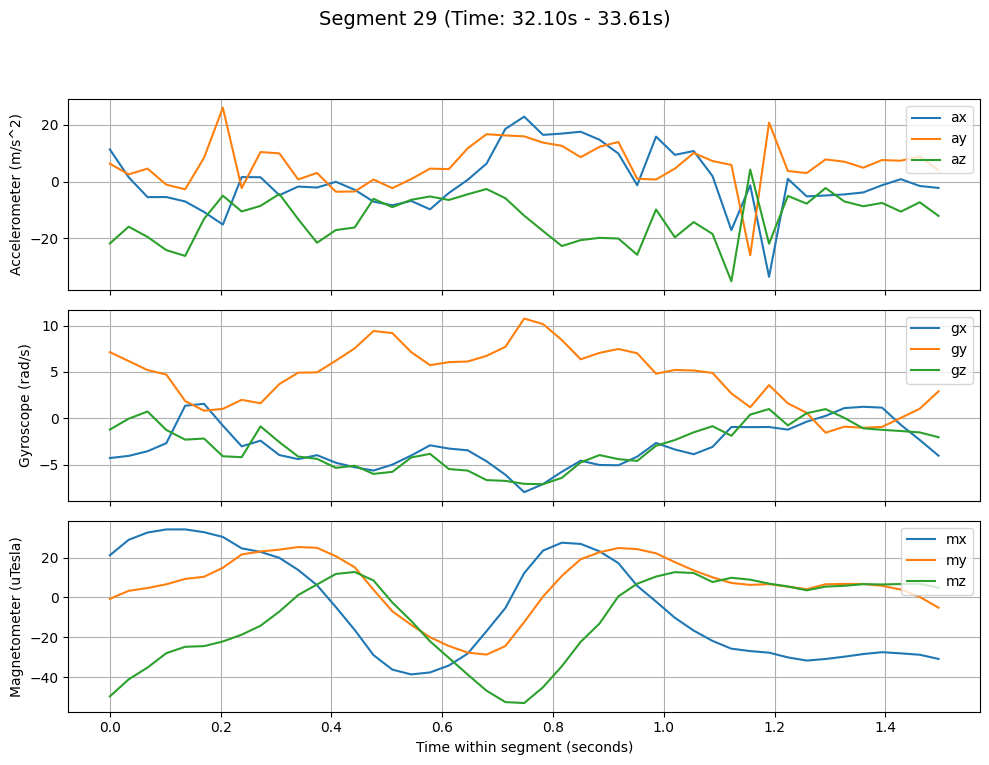


Displaying Segment 30. Close the plot window to enter label.


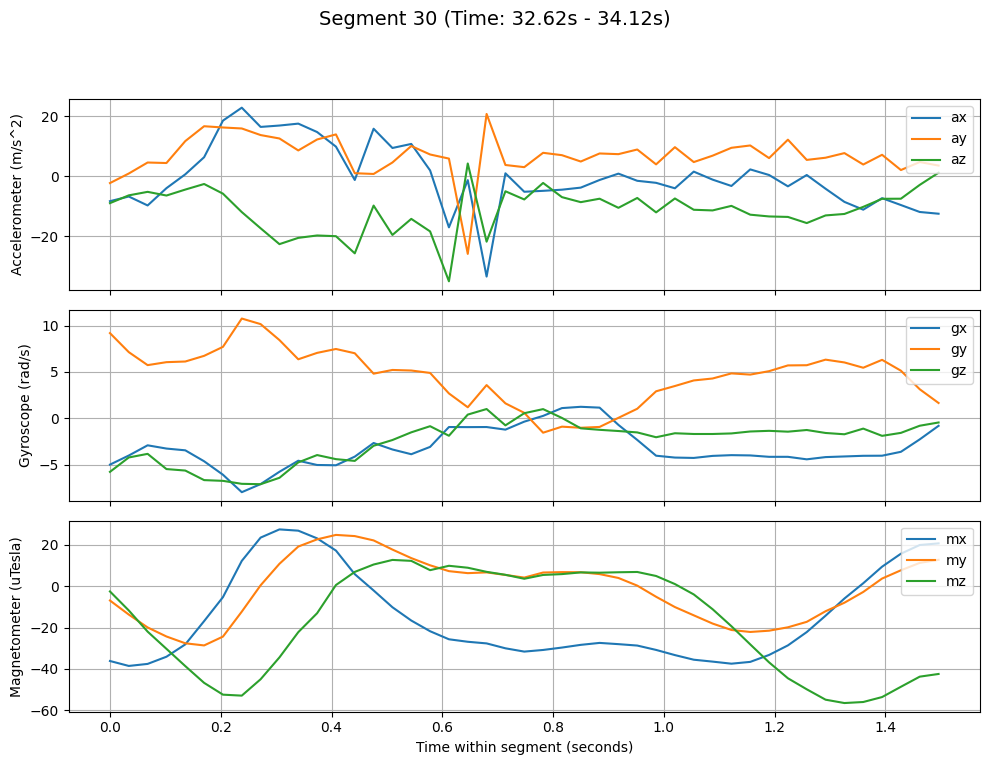


Displaying Segment 31. Close the plot window to enter label.


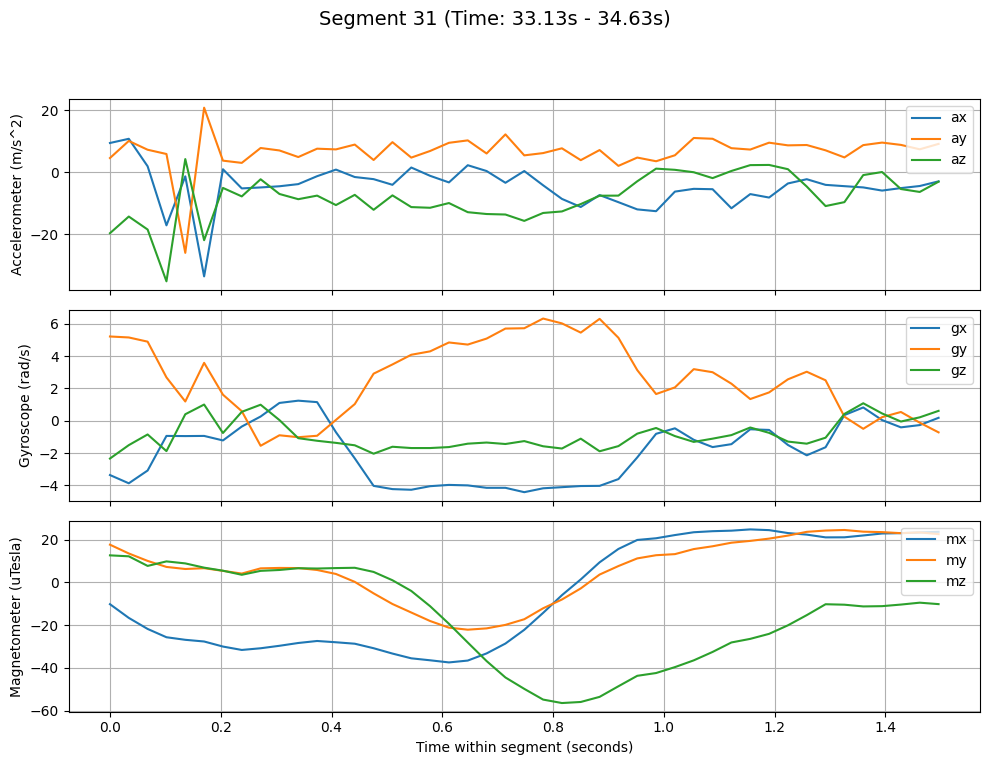


Displaying Segment 32. Close the plot window to enter label.


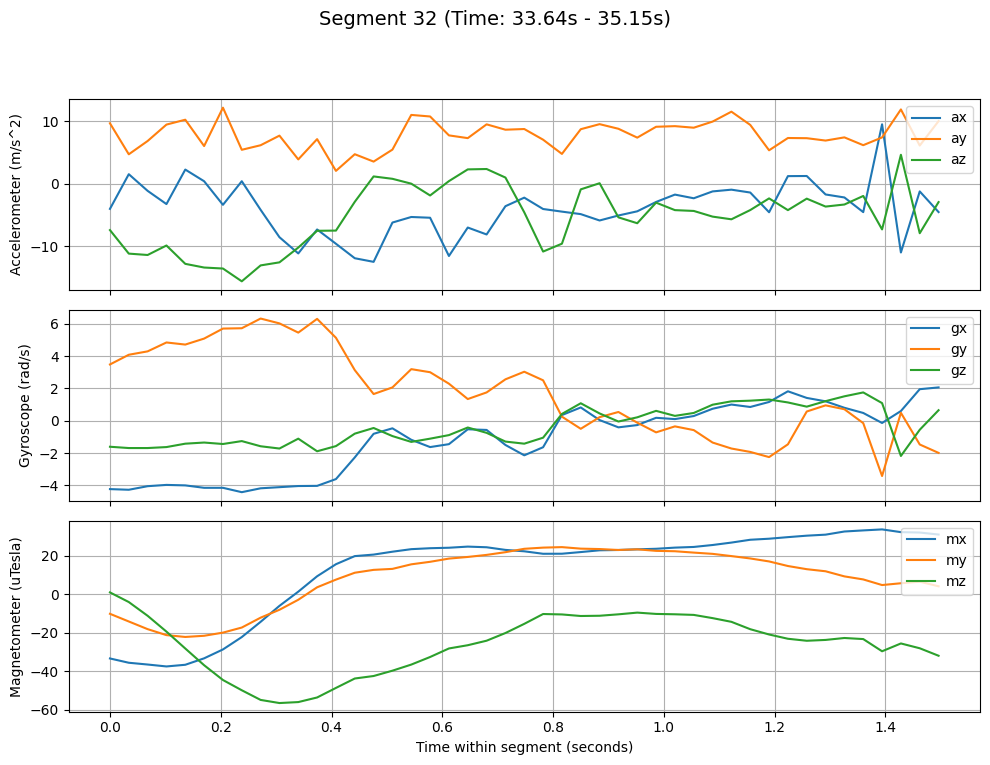


Displaying Segment 33. Close the plot window to enter label.


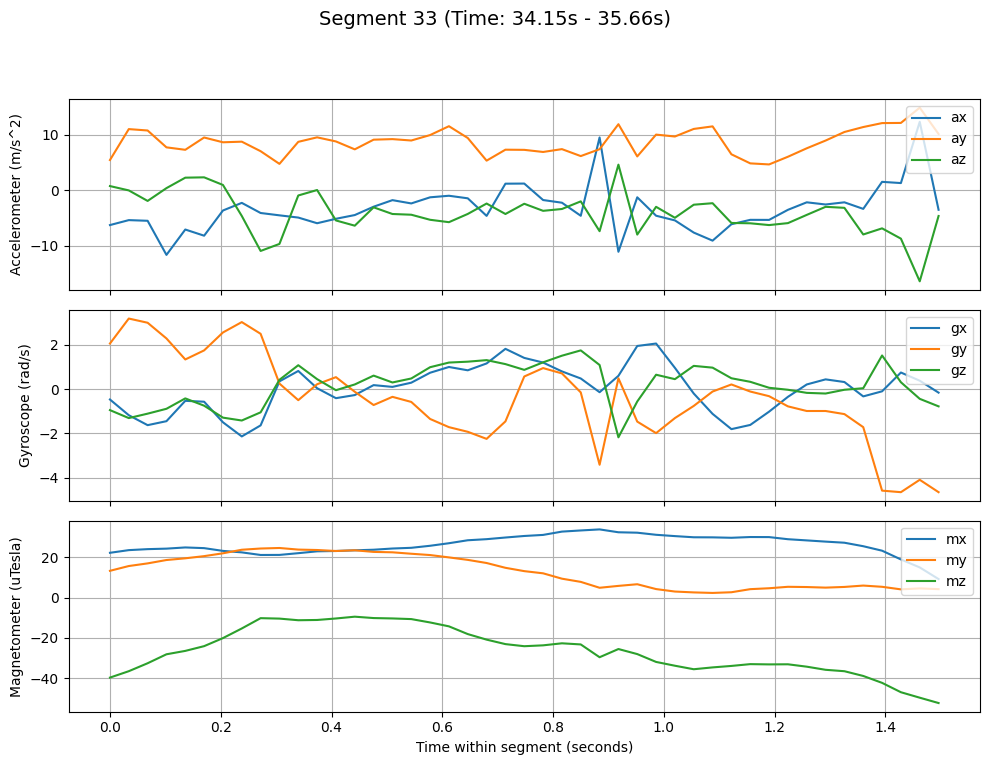


Displaying Segment 34. Close the plot window to enter label.


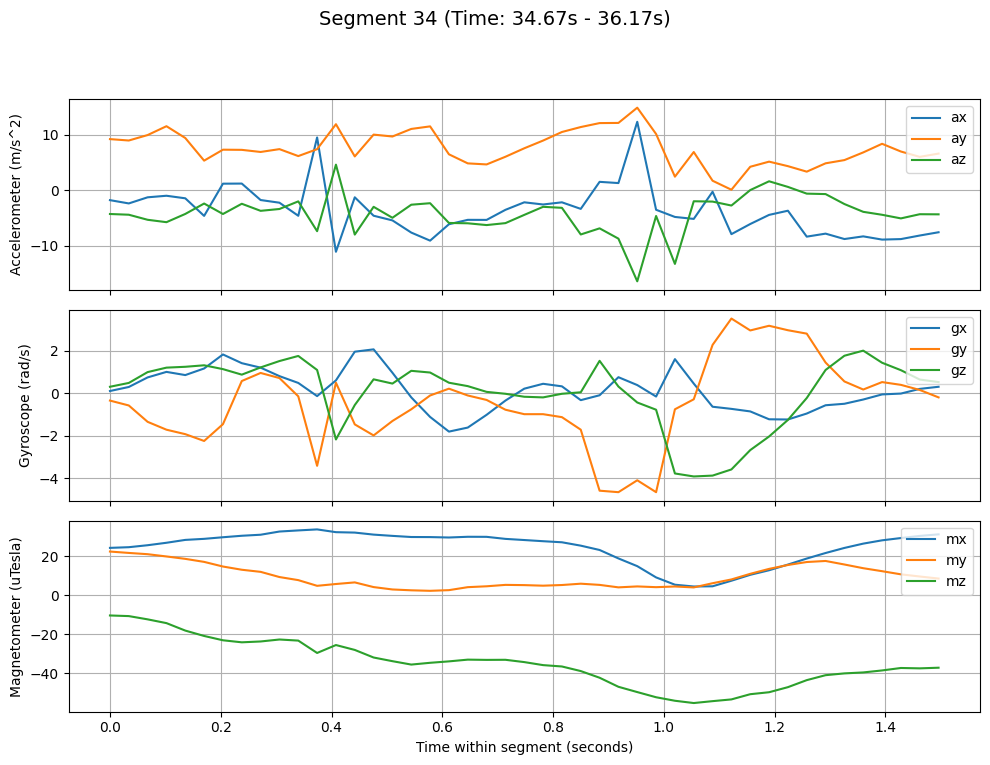


Displaying Segment 35. Close the plot window to enter label.


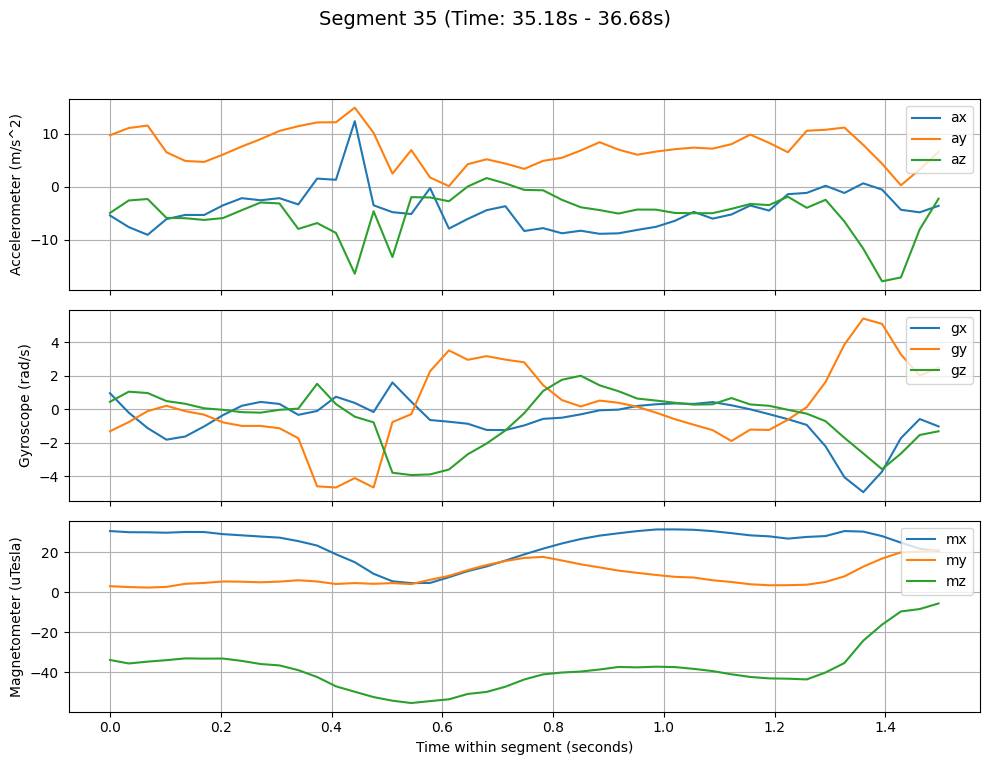


Displaying Segment 36. Close the plot window to enter label.


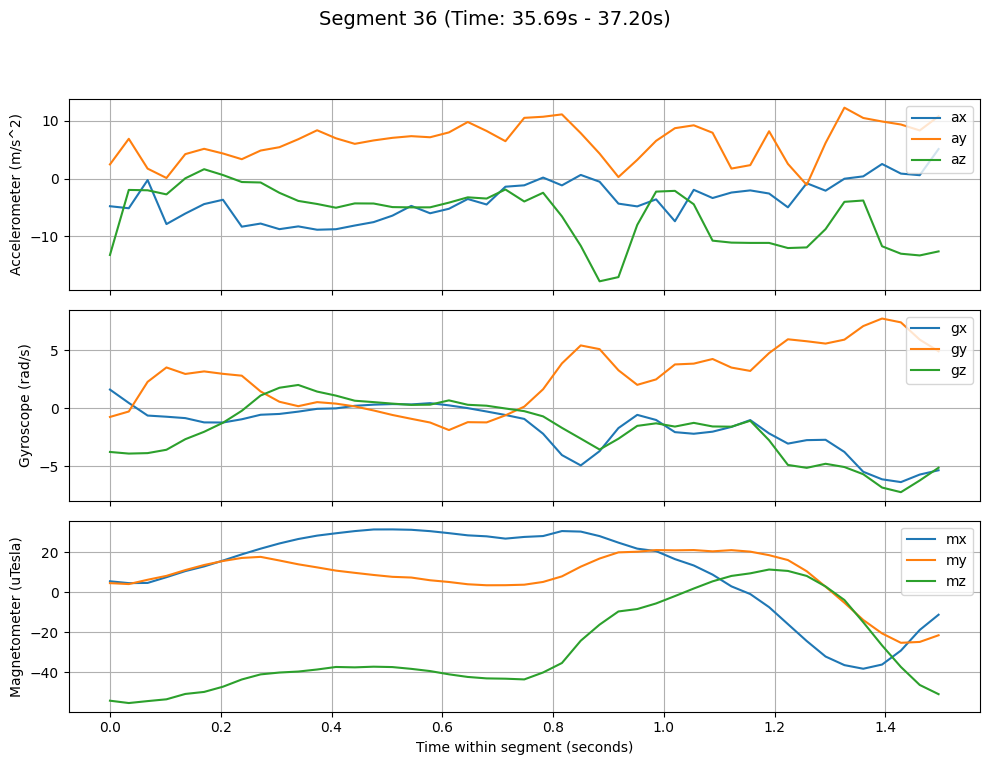


Displaying Segment 37. Close the plot window to enter label.


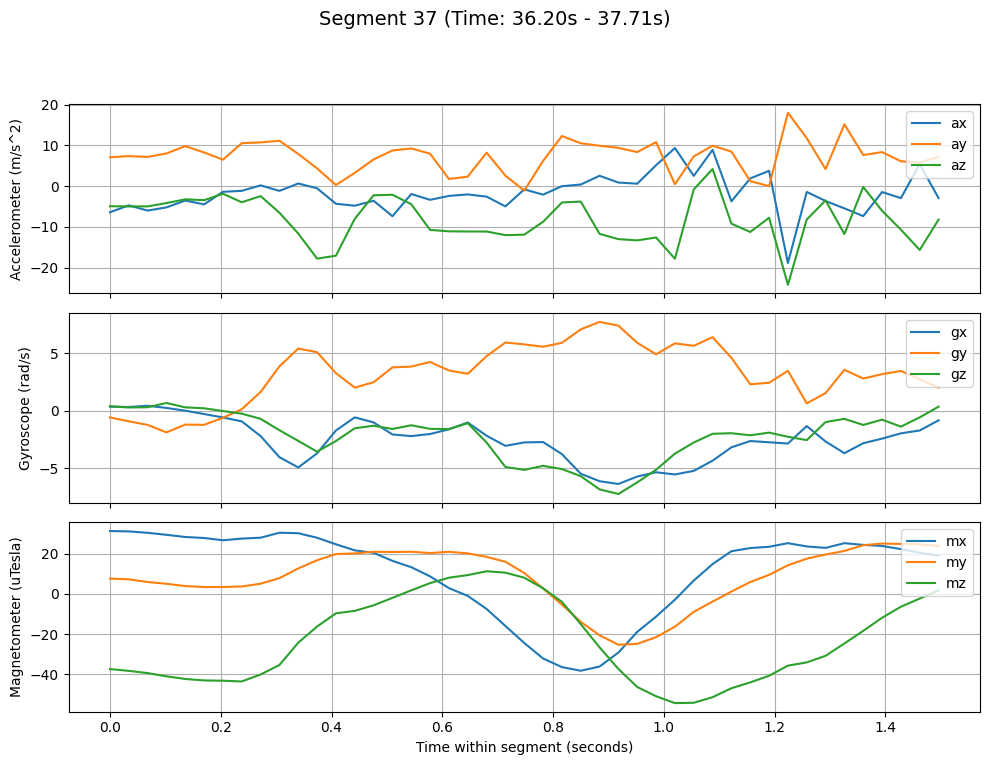


Displaying Segment 38. Close the plot window to enter label.


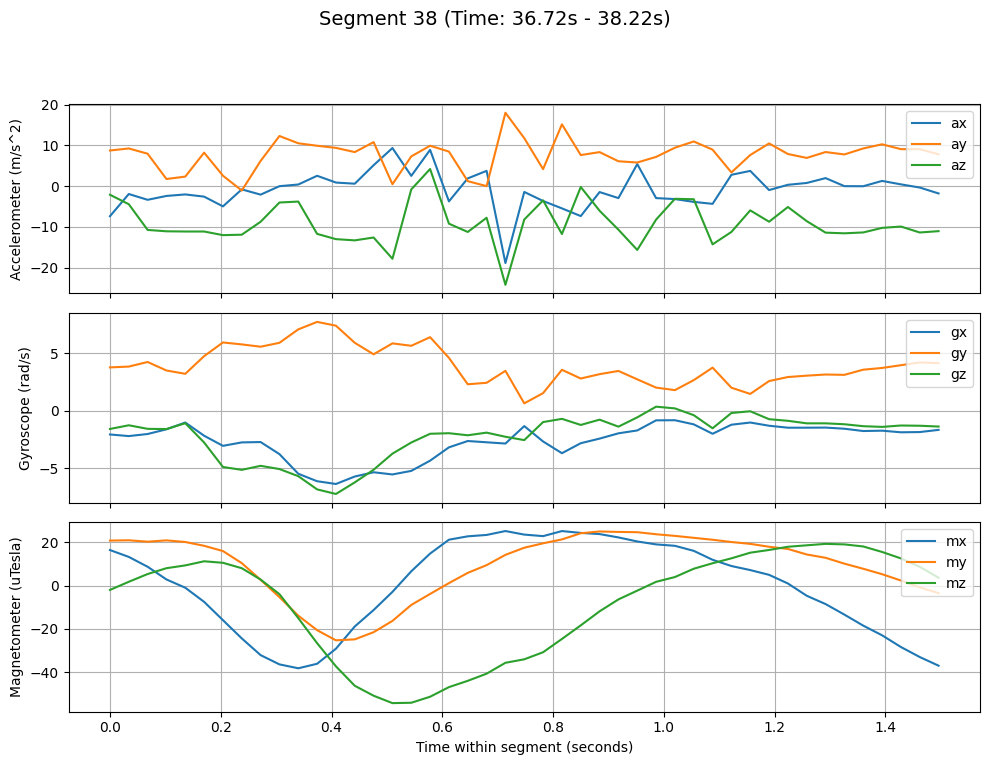


Displaying Segment 39. Close the plot window to enter label.


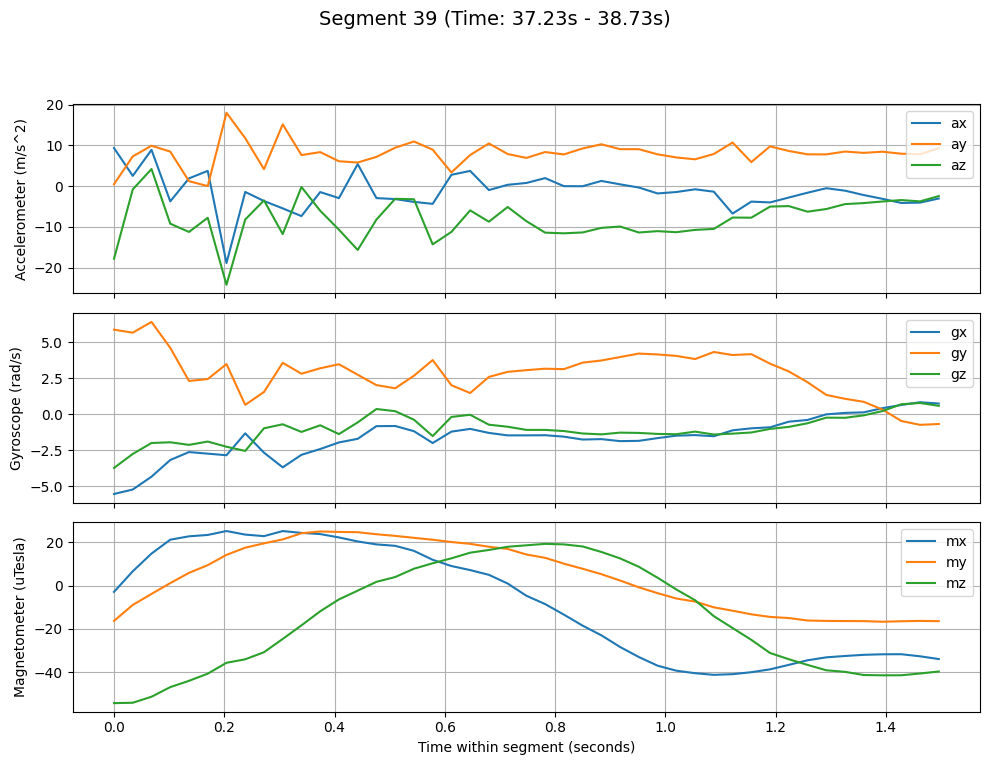


Displaying Segment 40. Close the plot window to enter label.


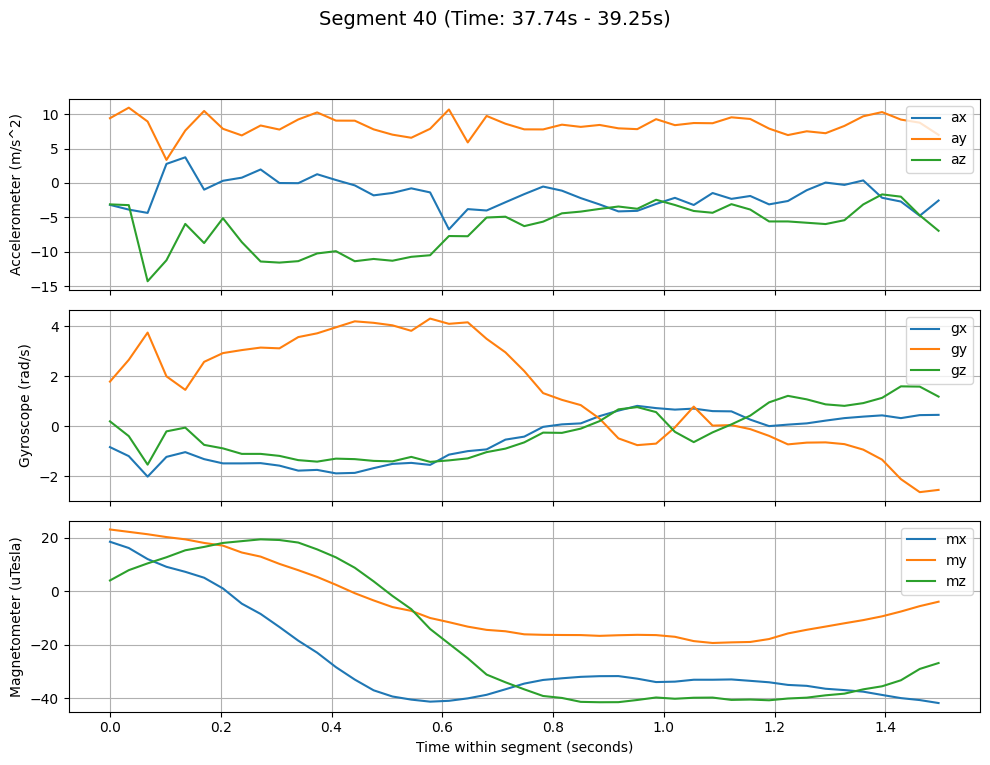


Displaying Segment 41. Close the plot window to enter label.


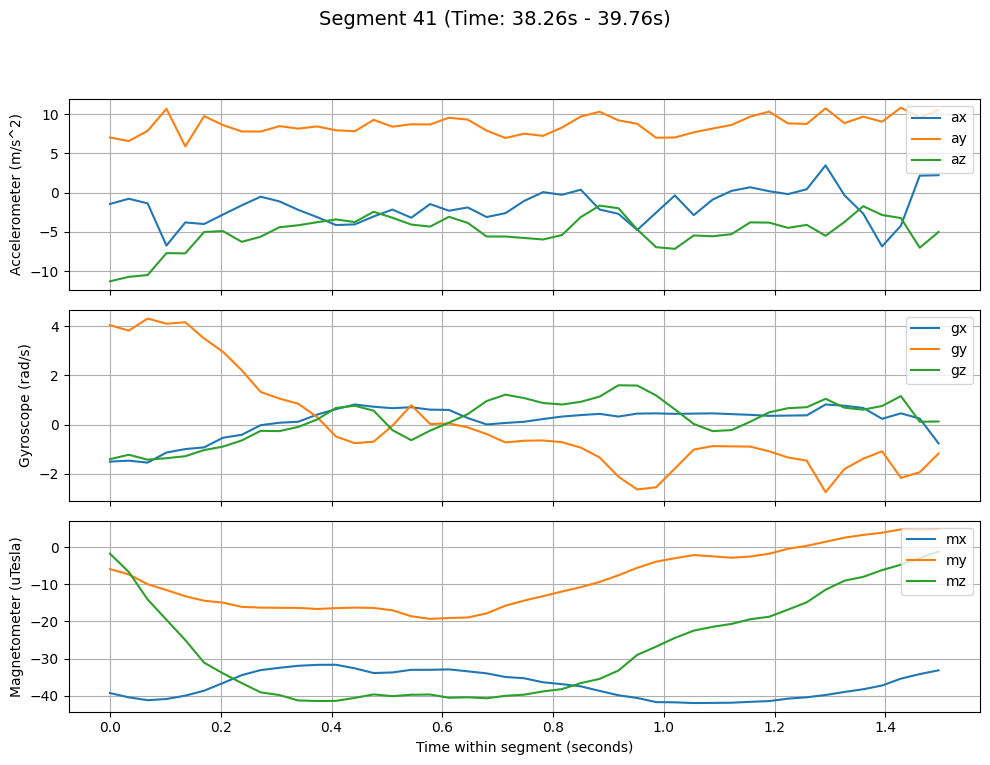


Displaying Segment 42. Close the plot window to enter label.


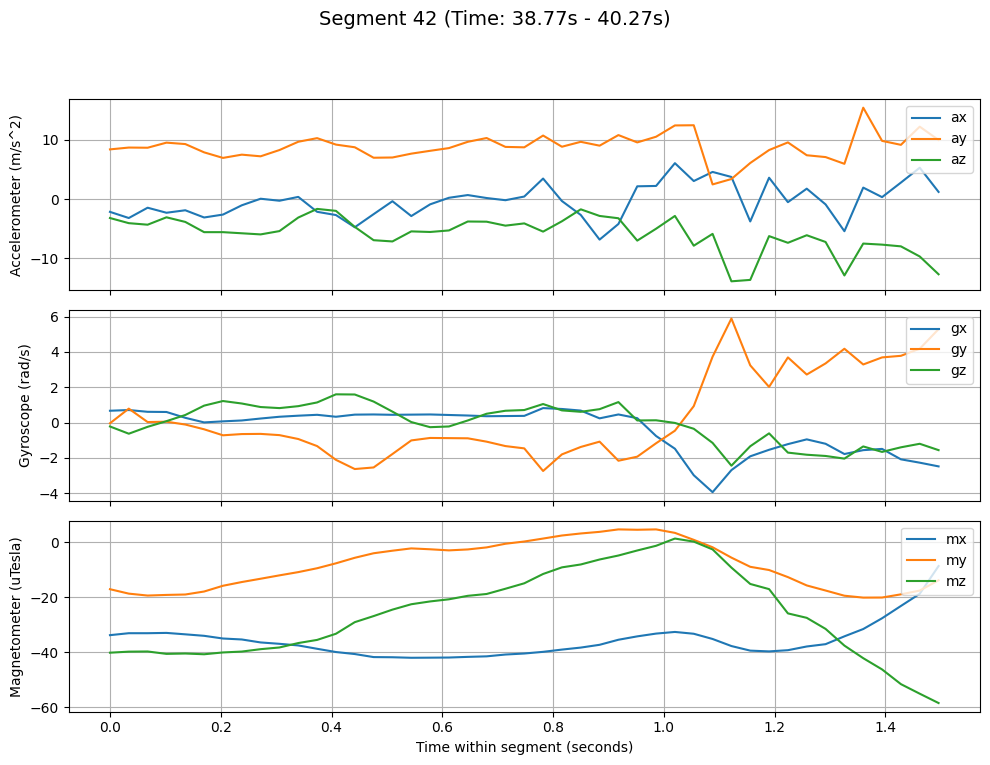


Displaying Segment 43. Close the plot window to enter label.


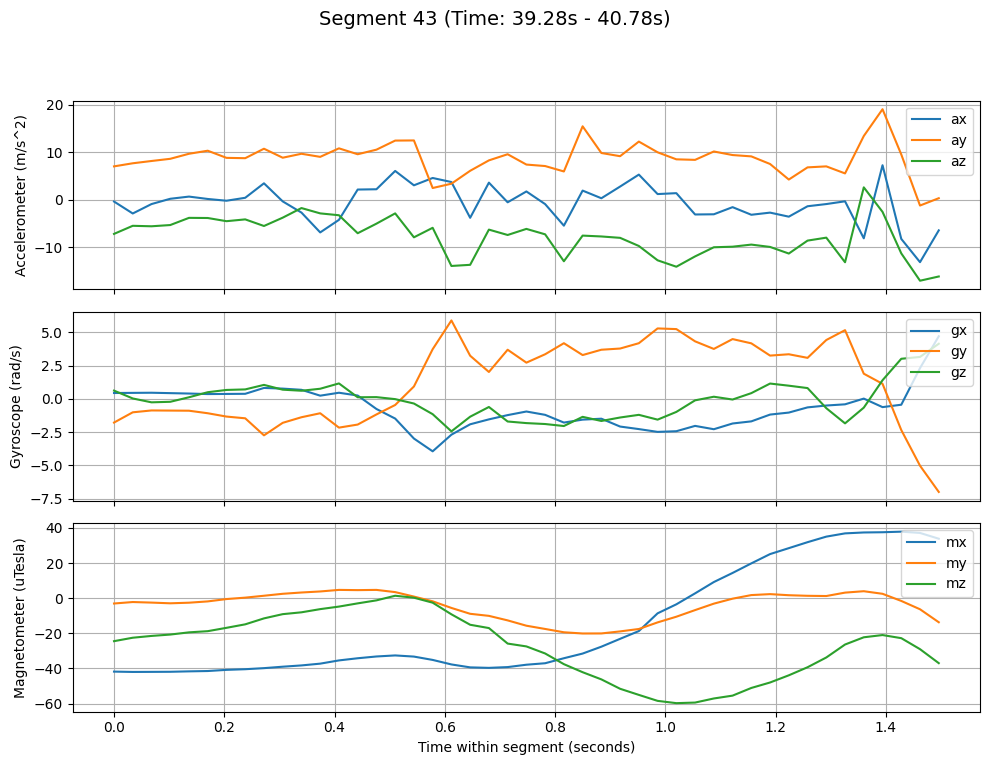


Displaying Segment 44. Close the plot window to enter label.


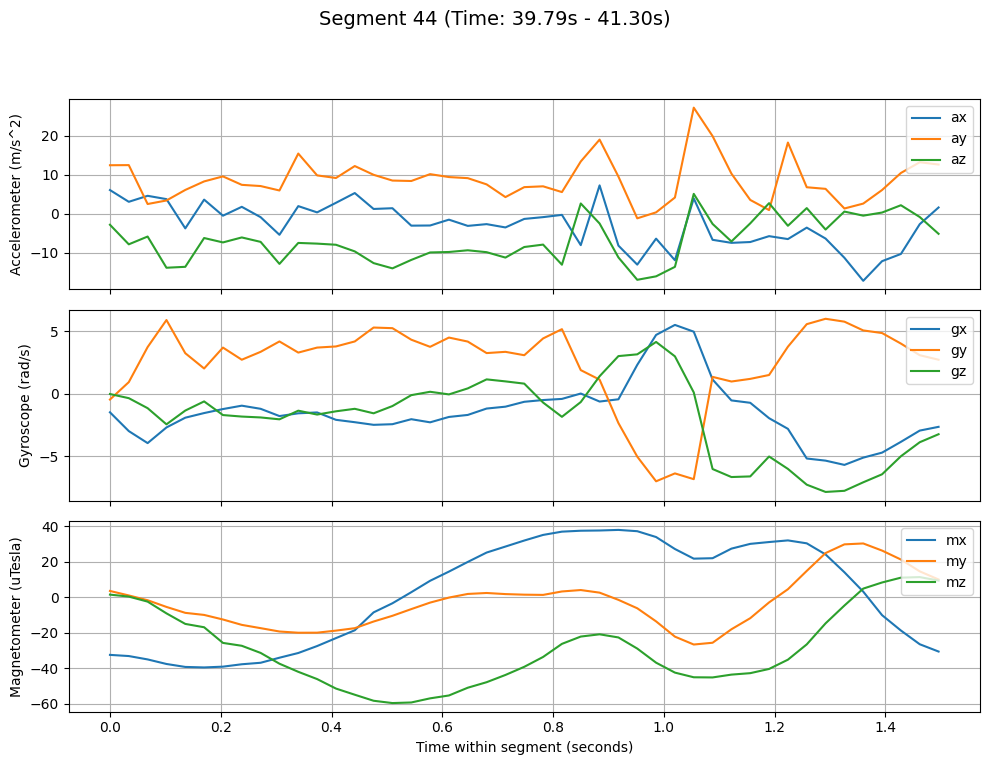


Displaying Segment 45. Close the plot window to enter label.


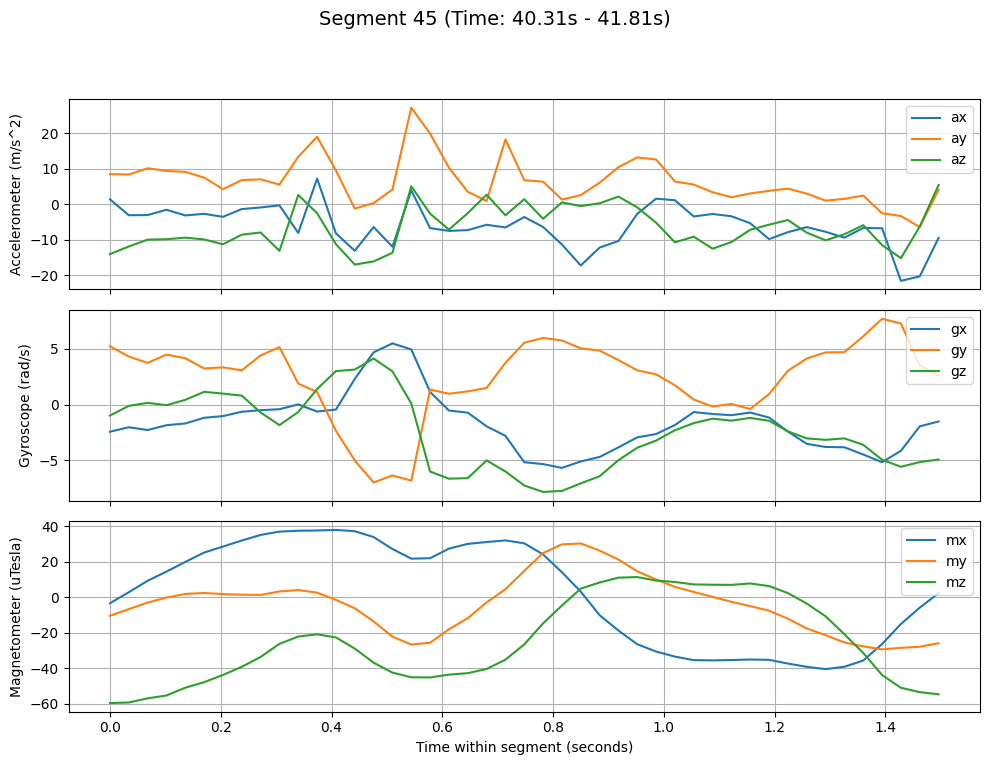


Displaying Segment 46. Close the plot window to enter label.


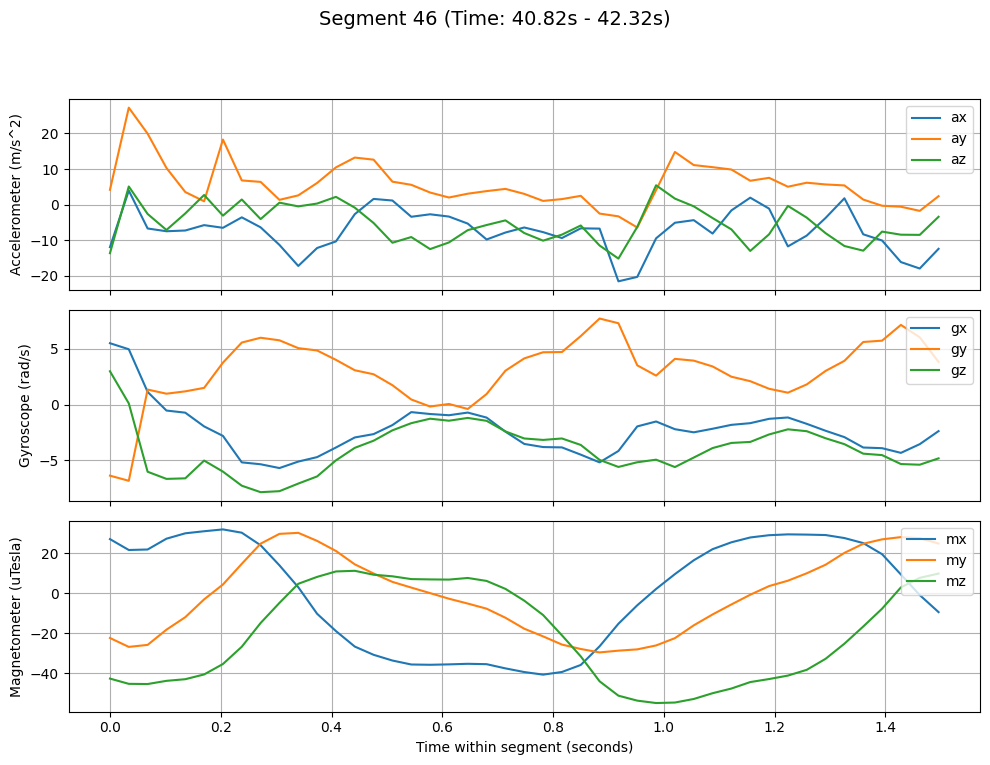


Displaying Segment 47. Close the plot window to enter label.


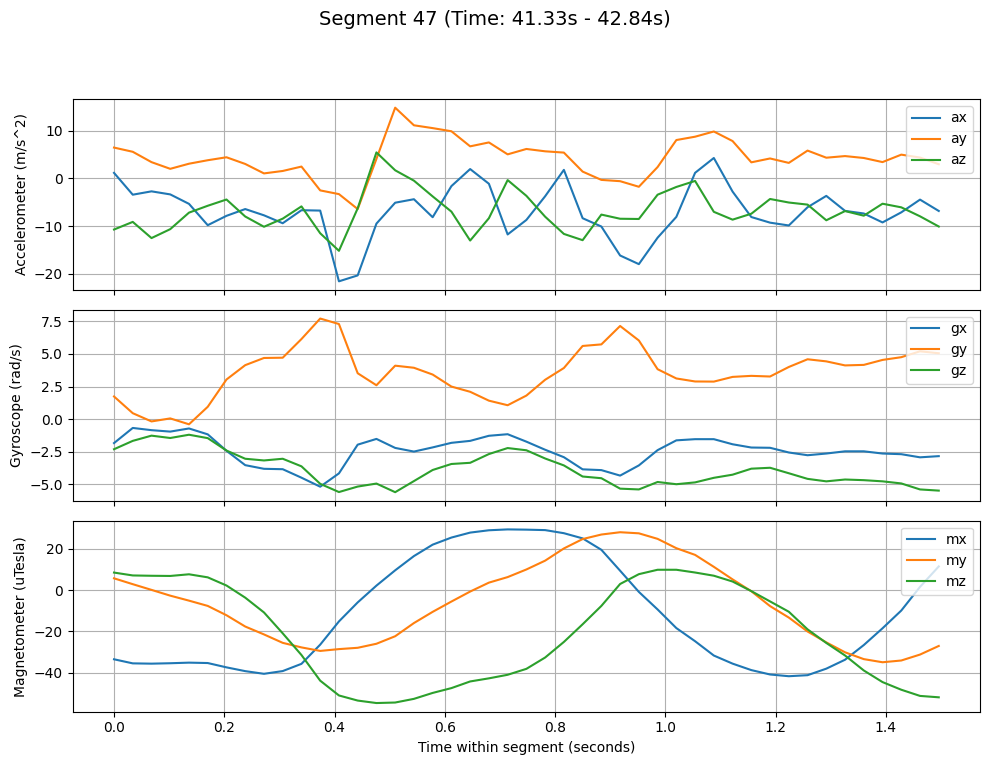


Displaying Segment 48. Close the plot window to enter label.


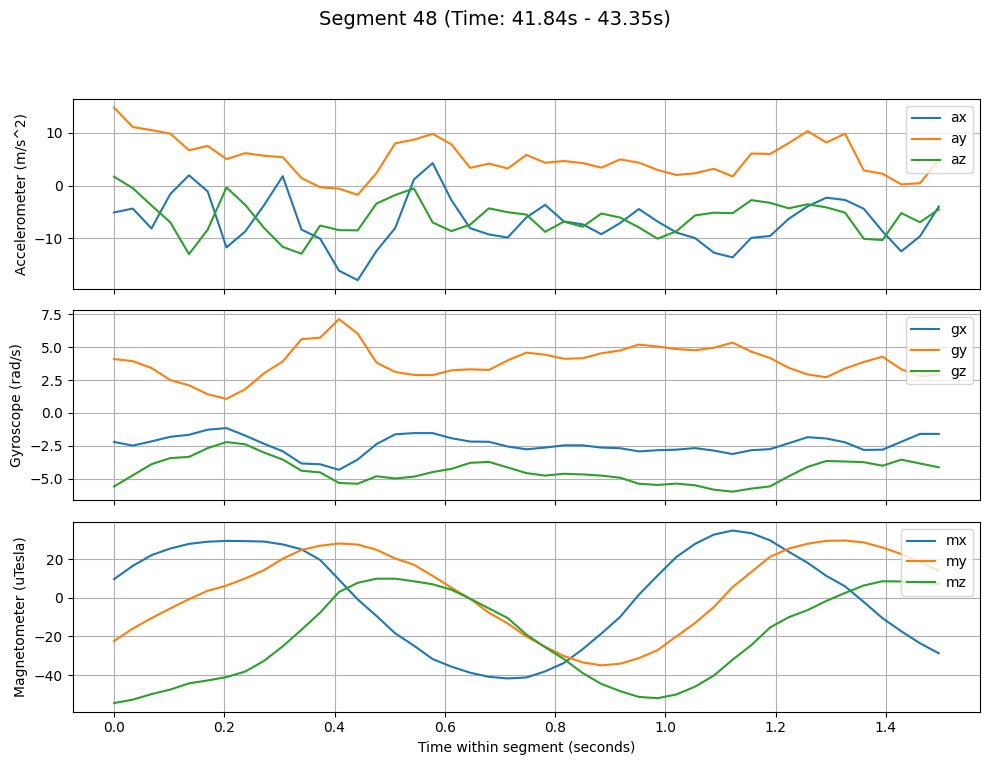


Displaying Segment 49. Close the plot window to enter label.


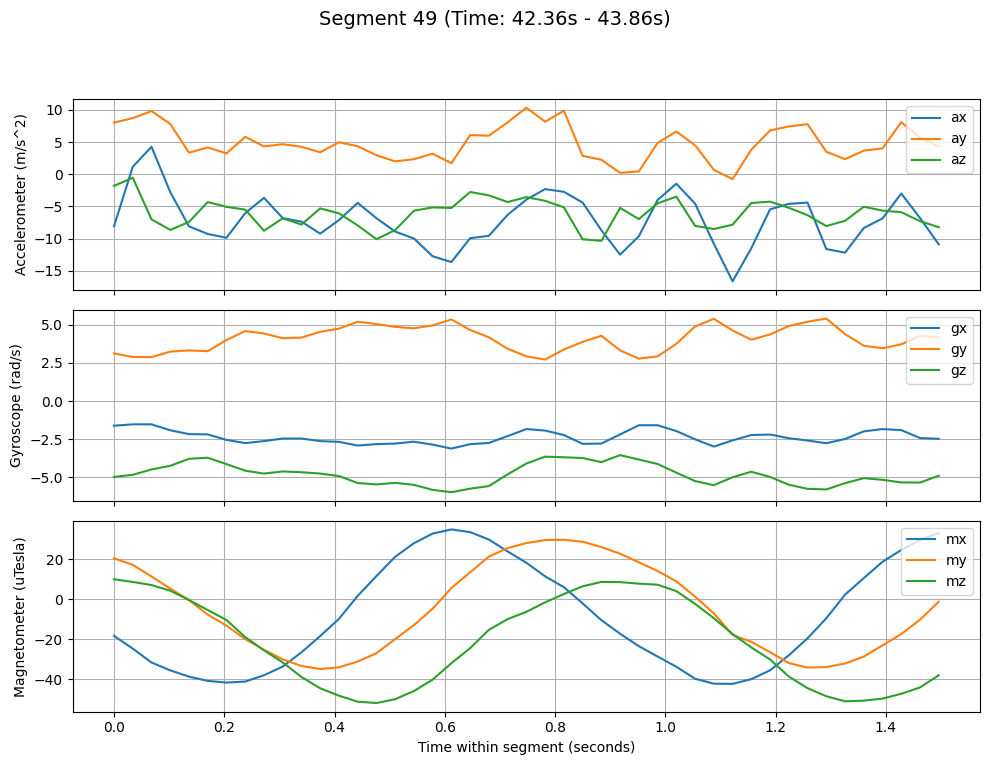


Displaying Segment 50. Close the plot window to enter label.


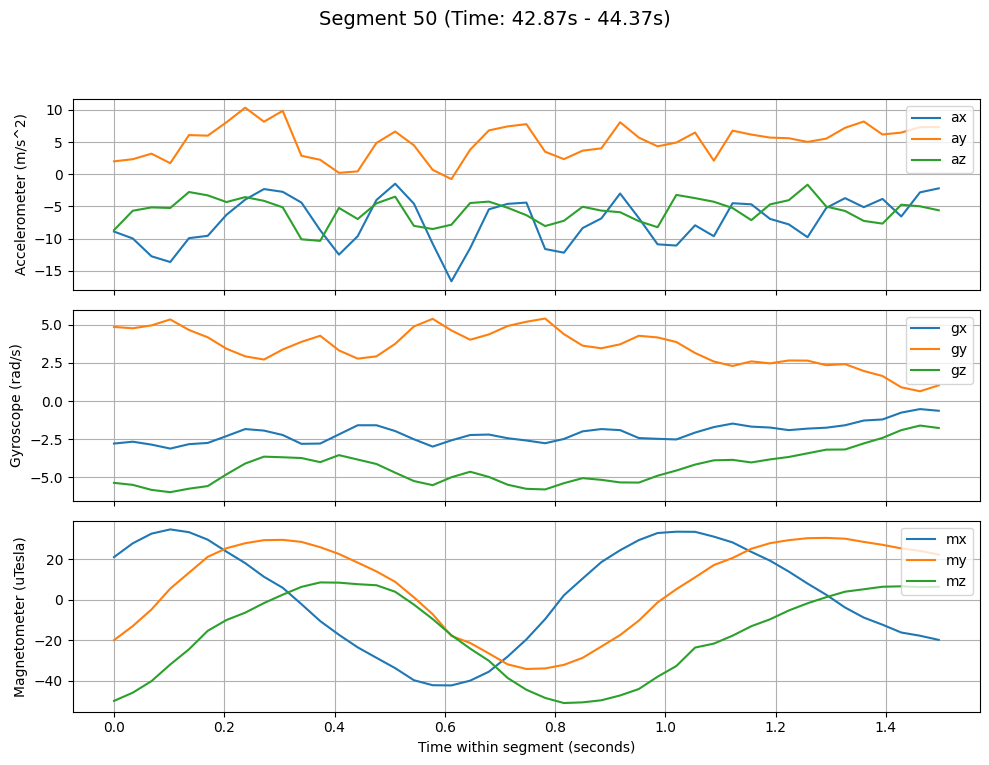


Displaying Segment 51. Close the plot window to enter label.


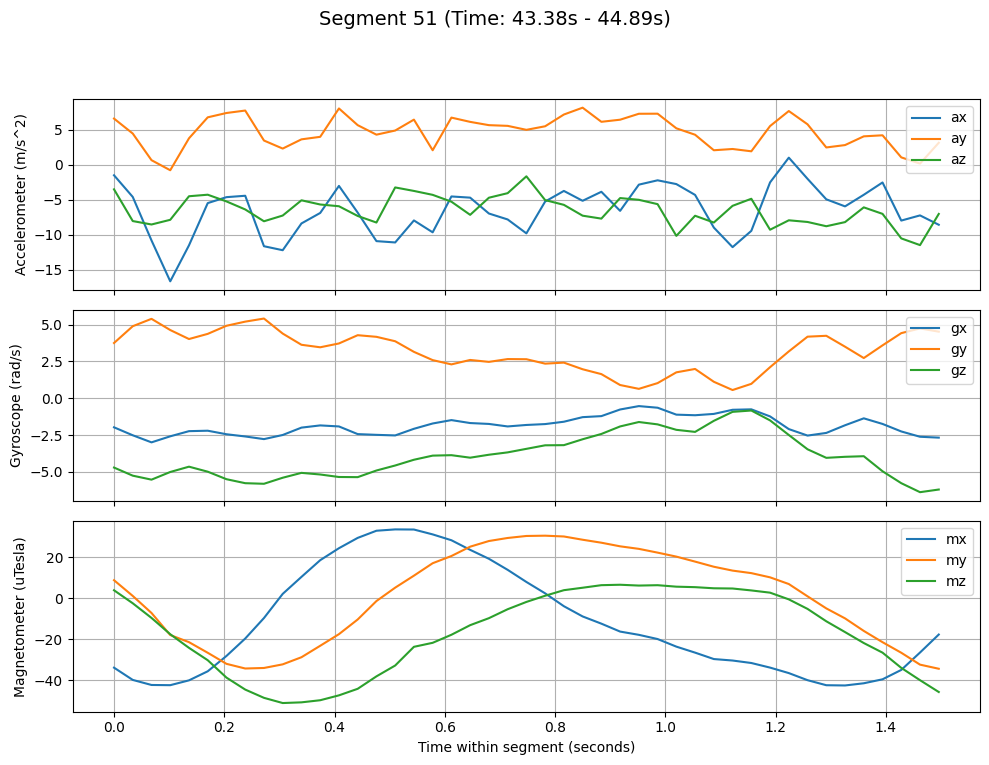


Displaying Segment 52. Close the plot window to enter label.


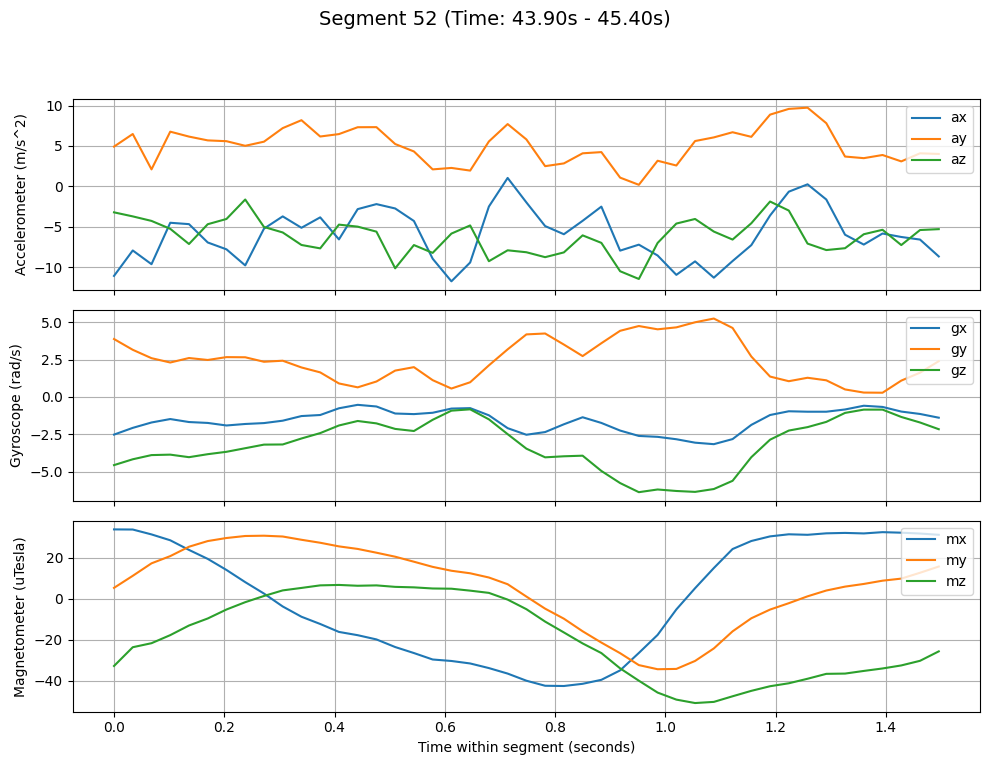


Displaying Segment 53. Close the plot window to enter label.


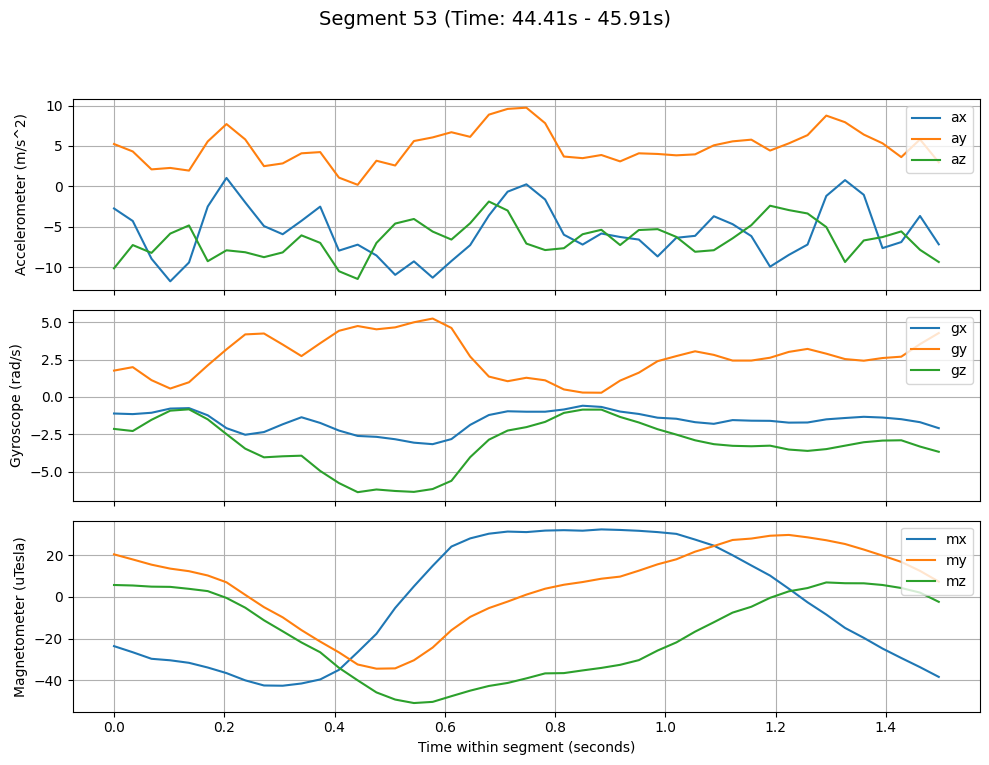


Displaying Segment 54. Close the plot window to enter label.


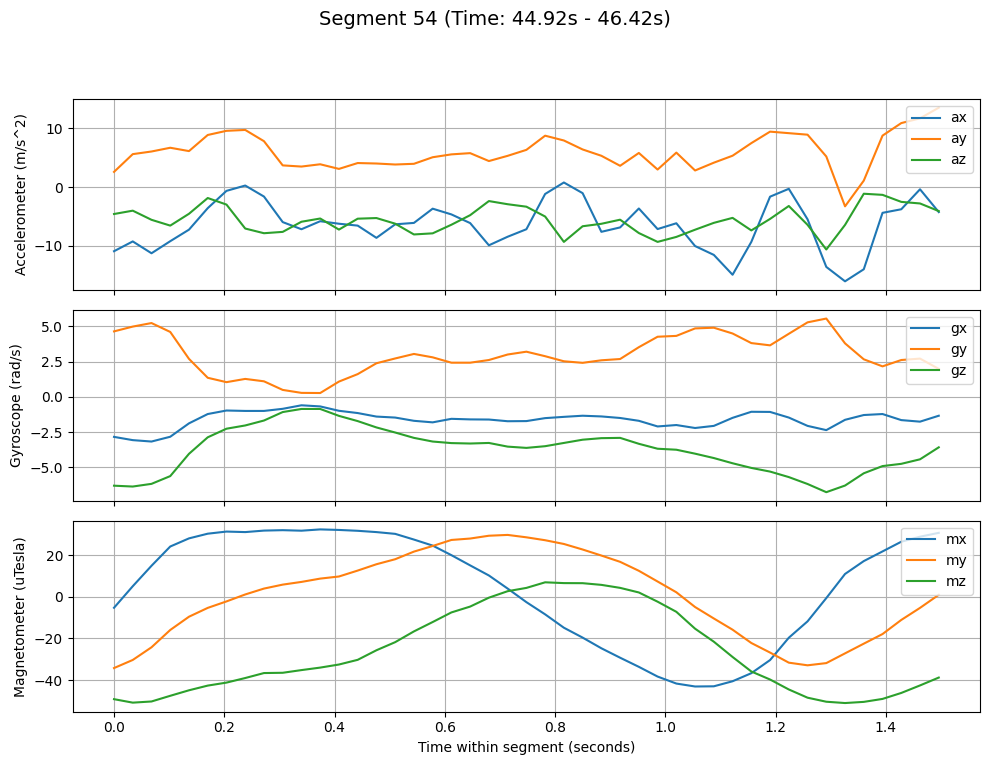


Displaying Segment 55. Close the plot window to enter label.


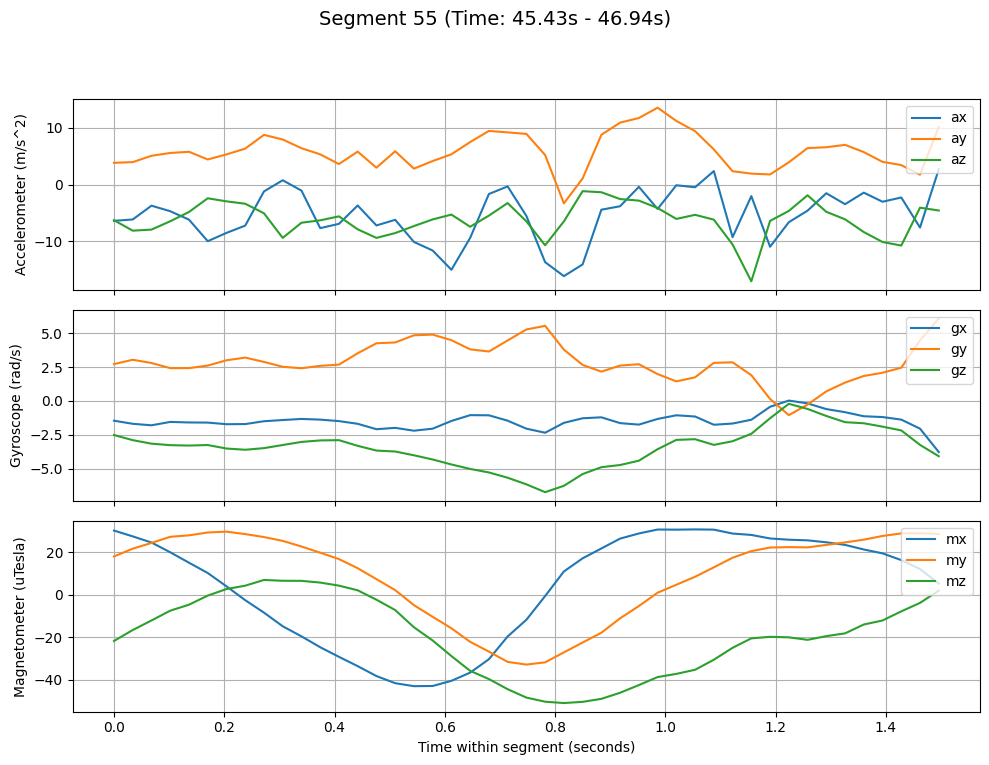


--- Labeling Complete ---
Total segments labeled: 681
Labeled segments saved to 'labeled_imu_segments.pkl'


In [24]:
# --- Main Execution ---
if __name__ == "__main__":
    # 1. Load Data
    df = load_data(CSV_FILE)
    if df is None:
        exit()

    # 2. Calculate Sampling Rate
    sampling_rate = calculate_sampling_rate(df)
    if sampling_rate is None:
         print("Could not determine sampling rate. Exiting.")
         exit()

    # Calculate window and slide size in samples
    window_size = math.ceil(WINDOW_DURATION_S * sampling_rate)
    slide_size = math.ceil(SLIDE_DURATION_S * sampling_rate)
    print(f"Window size: {window_size} samples ({WINDOW_DURATION_S}s)")
    print(f"Slide size: {slide_size} samples ({SLIDE_DURATION_S}s)")

    if window_size <= 0 or slide_size <=0:
        print("Error: Window or slide size calculated as zero or negative. Check durations and sampling rate.")
        exit()
    if window_size > len(df):
         print(f"Warning: Window size ({window_size}) is larger than total samples ({len(df)}).")
         # Adjust or exit depending on desired behavior. Let's proceed but it will only generate 0 segments.

    # 3. Plot Full Data
    plot_full_data(df)

    # 4. Windowing and Labeling
    labeled_segments
    features_to_keep = ['ax', 'ay', 'az', 'gx', 'gy', 'gz', 'mx', 'my', 'mz']
    segment_index = 0

    print("\n--- Starting Manual Labeling ---")
    print(f"Enter one of the following labels for each segment:")
    print(f"  {', '.join(VALID_LABELS[:-1])}")
    print(f"Enter 'quit' to stop labeling.")

    for i in range(0, len(df) - window_size + 1, slide_size):
        start_index = i
        end_index = i + window_size

        segment_df = df.iloc[start_index:end_index]
        segment_data = segment_df[features_to_keep].values # Extract data as numpy array, no timestamp

        # Get segment time range for plotting title
        start_time_s = df.iloc[start_index]['timestamp'] / 1000.0
        end_time_s = df.iloc[end_index - 1]['timestamp'] / 1000.0 # Use end_index-1 as end_index is exclusive

        # Plot the segment
        plot_segment(segment_data, segment_index, start_time_s, end_time_s, sampling_rate)

        # Get user label
        while True:
            user_label = input(f"Segment {segment_index} | Label ({'/'.join(VALID_LABELS)}): ").lower().strip()
            if user_label in VALID_LABELS:
                break
            else:
                print(f"Invalid label. Please enter one of: {', '.join(VALID_LABELS)}")

        if user_label == 'quit':
            print("Quit command received. Stopping labeling.")
            break

        # Store the data and label
        labeled_segments.append({
            'data': segment_data,
            'label': user_label,
            'start_time_s': start_time_s, # Optional: keep for reference
            'end_time_s': end_time_s    # Optional: keep for reference
        })
        segment_index += 1

    print(f"\n--- Labeling Complete ---")
    print(f"Total segments labeled: {len(labeled_segments)}")

    # 5. Save Labeled Data
    if labeled_segments:
        try:
            with open(OUTPUT_FILE, 'wb') as f:
                pickle.dump(labeled_segments, f)
            print(f"Labeled segments saved to '{OUTPUT_FILE}'")
        except Exception as e:
            print(f"Error saving data: {e}")
    else:
        print("No segments were labeled, nothing to save.")

In [6]:
import pickle

def load_imu_segments(file_path):
    """
    Loads labeled IMU segments from a pickle file.

    Args:
        file_path (str): The path to the pickle file.

    Returns:
        object: The object loaded from the pickle file.  This will
                likely be a list, dictionary, or custom object
                depending on how the pickle file was created.
    """
    try:
        with open(file_path, 'rb') as f:  # 'rb' for read binary
            data = pickle.load(f)
        return data
    except FileNotFoundError:
        print(f"Error: File not found at {file_path}")
        return None
    except Exception as e:
        print(f"An error occurred: {e}")
        return None

# Example usage:
file_path = file_path = 'C:\\Users\\user\\OneDrive - Nanyang Technological University\\Y4S2\\FYP\\labeled_imu_segments.pkl'

labeled_segments = load_imu_segments(file_path)

if labeled_segments:
    print("Data loaded successfully.")
    # Now you can work with the loaded_data object.
    # For example, if it's a list:
    # for item in loaded_data:
    #     print(item)
else:
    print("Failed to load data.")


Data loaded successfully.


In [7]:
len(labeled_segments)

737

In [8]:
import pickle

# Define the file path where you want to save the object
save_file_path = 'new_saved_labeled_segments.pkl'

try:
    with open(save_file_path, 'wb') as f:  # 'wb' for write binary
        pickle.dump(labeled_segments, f)
    print("Data saved successfully.")
except Exception as e:
    print(f"An error occurred while saving the data: {e}")

Data saved successfully.


In [16]:
import pickle

def load_labeled_segments(file_path):
    """
    Loads labeled IMU segments from a pickle file.

    Args:
        file_path (str): The path to the pickle file.

    Returns:
        list: A list of dictionaries, where each dictionary represents a
              labeled segment with keys 'data', 'label', 'start_time_s', and
              'end_time_s'. Returns None if loading fails.
    """
    try:
        with open(file_path, 'rb') as f:
            labeled_segments = pickle.load(f)
        return labeled_segments
    except FileNotFoundError:
        print(f"Error: File not found at {file_path}")
        return None
    except Exception as e:
        print(f"An error occurred during loading: {e}")
        return None


# Example Usage (assuming you have the OUTPUT_FILE variable defined):
#  and have run the first part of the code that created the pickle file.
if __name__ == "__main__":
    OUTPUT_FILE = 'labeled_imu_segments.pkl'  #  Make sure this matches your main script

    loaded_segments = load_labeled_segments(OUTPUT_FILE)

    if loaded_segments:
        print("Labeled segments loaded successfully!")
        # Example: Print the label of the first segment
        if loaded_segments: # Check if the list is not empty before accessing its elements
            print(f"First segment label: {loaded_segments[0]['label']}")

        # Further processing of the loaded data would go here...
        # For example, iterating through the segments:
        # for segment in loaded_segments:
        #     data = segment['data']
        #     label = segment['label']
        #     # Process the data and label as needed
    else:
        print("Failed to load labeled segments.")


Failed to load labeled segments.


In [15]:
labeled_segments

[]


Displaying plot of the full dataset. Close the plot window to continue...


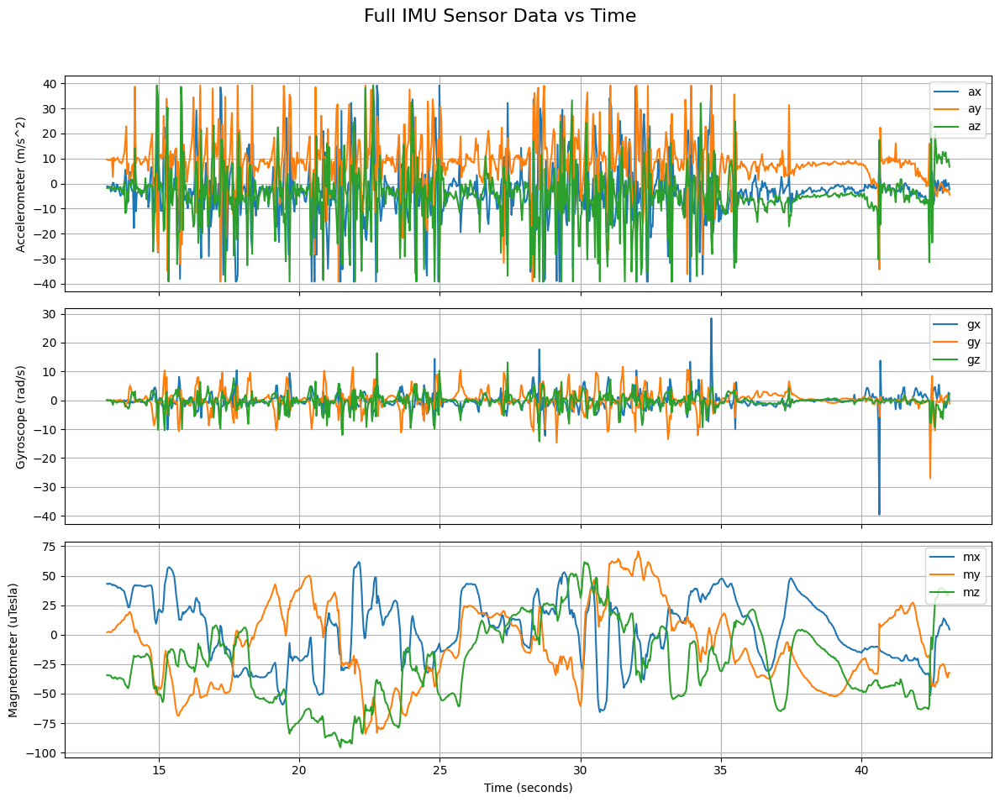


Displaying plot of the full dataset. Close the plot window to continue...


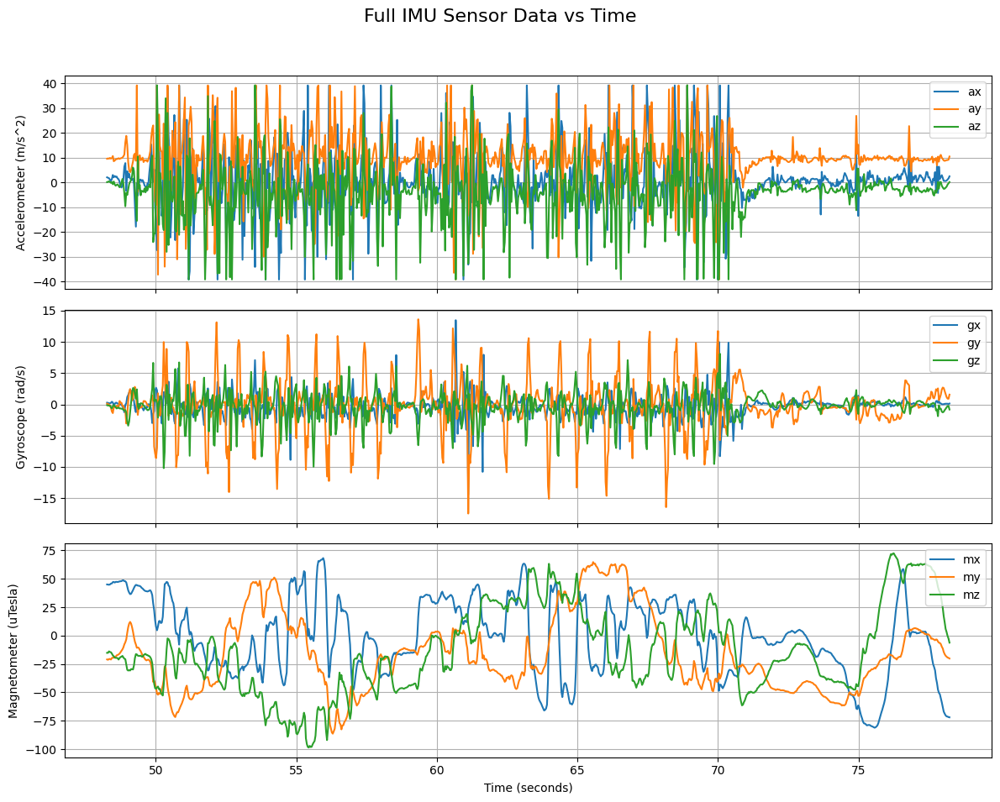


Displaying plot of the full dataset. Close the plot window to continue...


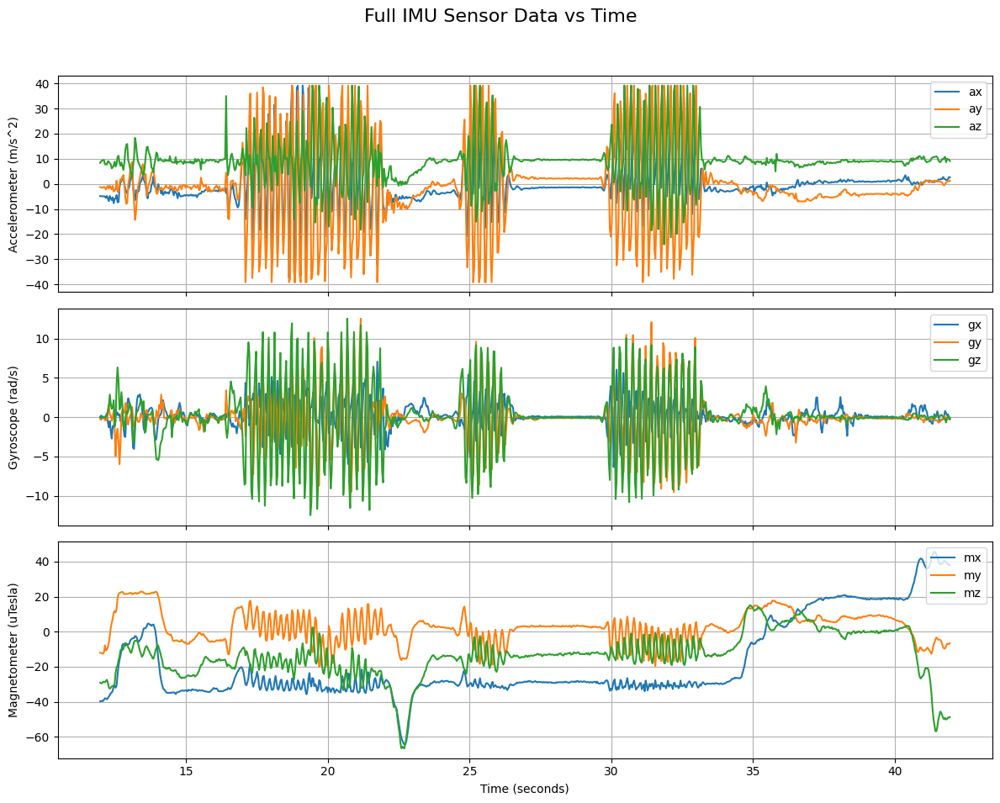

In [18]:
df = pd.read_csv("Done\sensor_wiper_2.csv")
plot_full_data(df)
df = pd.read_csv("Done\sensor_wiper.csv")
plot_full_data(df)

df = pd.read_csv("sensor_tester.csv")
plot_full_data(df)